In [1]:
import timm
import time 
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from medmnist import INFO
import numpy as np
import faiss
import copy
from tqdm import tqdm

import warnings
warnings.filterwarnings("ignore")

In [2]:
torch.__version__

'2.6.0+cu118'

In [3]:
## GLOBAL 

CHANNELS = 3 
N_CLASSES = 1000

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

print("Using device:", device)

Using device: cuda:0


In [4]:
import os
from torchvision import datasets, transforms
import torch

print(f"Step 1: Loading dataset with resize transform...")

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406],
                         [0.229, 0.224, 0.225]) 
])

val_data_dir = 'dataset/imagenet_validation' 
test_data_dir = 'dataset/imagenet_tests'

val_dataset = datasets.ImageFolder(os.path.join(val_data_dir), transform=transform) 

test_datasets = {
    f'test{i}': datasets.ImageFolder(os.path.join(test_data_dir, f'test{i}'), transform=transform)
    for i in range(1, 11)
}

print(f"Validation samples: {len(val_dataset)}")
print(f"Validation samples: {len(test_datasets['test1'])}")

Step 1: Loading dataset with resize transform...
Validation samples: 30000
Validation samples: 2000


In [5]:
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4) 
test_loader = DataLoader(test_datasets['test1'], batch_size=1, shuffle=False, num_workers=4)  

In [6]:
import json
import urllib.request

url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
imagenet_classes = urllib.request.urlopen(url).read().decode().splitlines()
print(imagenet_classes[0])

tench


### Base Models 

In [51]:
def evaluate_pool(pool, test_loader):
    print("\nEvaluating individual classifiers on test set...")

    for i, model in enumerate(pool):
        model = model.to(device)  # <- Ensure model is on the correct device
        model.eval()
        correct = 0
        total = 0
        with torch.no_grad():
            for imgs, labels in test_loader:
                imgs, labels = imgs.to(device), labels.squeeze().long().to(device)
                outputs = model(imgs)
                preds = outputs.argmax(dim=1)
                correct += (preds == labels).sum().item()
                total += labels.numel()
        acc = correct / total * 100
        print(f"Classifier {i+1} ({model.__class__.__name__}): Accuracy = {acc:.2f}%")


from collections import Counter
import pandas as pd

def evaluate_pool_with_consensus(pool, test_loader):
    print("\nEvaluating individual classifiers and consensus...")

    num_classifiers = len(pool)
    total_samples = 0
    correct_matrix = []

    for i, model in enumerate(pool):
        model = model.to(device)
        model.eval()

    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs, labels = imgs.to(device), labels.squeeze().long().to(device)
            batch_size = imgs.size(0)
            total_samples += batch_size

            batch_corrects = torch.zeros((len(pool), batch_size), dtype=torch.bool)

            for i, model in enumerate(pool):
                outputs = model(imgs)
                preds = outputs.argmax(dim=1)
                batch_corrects[i] = preds == labels

            correct_matrix.append(batch_corrects)

    # Stack across all batches -> shape: (num_classifiers, total_samples)
    correct_matrix = torch.cat(correct_matrix, dim=1)

    # Count how many models got each sample correct
    consensus_counts = correct_matrix.sum(dim=0).cpu().numpy()  # shape: (total_samples,)
    consensus_distribution = Counter(consensus_counts)

    # Get indices for 0 and 1 correct predictions
    only_one_model_indices = [i for i, count in enumerate(consensus_counts) if count == 1]
    zero_model_indices = [i for i, count in enumerate(consensus_counts) if count == 0]

    # Print table
    print("\nConsensus Accuracy Table:")
    print(f"{'Models Correct':>15} | {'# Samples':>10}")
    print("-" * 30)
    for i in range(num_classifiers, -1, -1):  # include 0
        count = consensus_distribution.get(i, 0)
        print(f"{i:>15} | {count:>10}")
    print("-" * 30)
    print(f"{'Total Samples':>15} | {total_samples:>10}")

    # Print detailed list of samples found by 1 or 0 models
    print(f"\n Indices of samples found by only 1 model: {only_one_model_indices}")
    print(f"   Total: {len(only_one_model_indices)}")

    print(f"\n Indices of samples found by 0 models: {zero_model_indices}")
    print(f"   Total: {len(zero_model_indices)}")

    # return only_one_model_indices, zero_model_indices  # optional: return them for further use


def evaluate_pool_DC(pool, test_loader):
    print("\nEvaluating individual classifiers on test set...")

    results = []

    for batch_imgs, batch_labels in test_loader:
        batch_imgs = batch_imgs.to(device)
        batch_labels = batch_labels.squeeze().long().to(device)

        batch_results = []
        for model in pool:
            model = model.to(device)
            model.eval()
            with torch.no_grad():
                outputs = model(batch_imgs)
                preds = outputs.argmax(dim=1)
                correct = preds == batch_labels  # Boolean tensor
                batch_results.append(correct.cpu().tolist())  # Add to results

        # Transpose so each row is per-sample result for all models
        batch_results = list(zip(*batch_results))  # shape: (batch_size, num_models)
        results.extend(batch_results)

    # Create a DataFrame
    columns = [f"Classifier_{i+1}" for i in range(len(pool))]
    df = pd.DataFrame(results, columns=columns)

    print(df.head())  # Optional: to preview first few rows
    return df 


import pandas as pd
import itertools

def compute_total_difficulty_per_combination(df):
    num_models = df.shape[1]
    model_indices = list(range(num_models))
    all_combinations = []

    # Generate all non-empty combinations (1 to num_models)
    for r in range(1, num_models + 1):
        all_combinations.extend(itertools.combinations(model_indices, r))

    total_difficulty = []

    for combo in all_combinations:
        total_score = 0.0
        for _, row in df.iterrows():
            correct_preds = row.iloc[list(combo)]
            coverage = correct_preds.sum()
            difficulty = 1 / (coverage + 1)
            total_score += difficulty

        total_difficulty.append({
            "Model Combination": combo,
            "Total Difficulty Score": total_score
        })

    result_df = pd.DataFrame(total_difficulty)
    return result_df.sort_values(by="Total Difficulty Score", ascending=False).reset_index(drop=True)


In [13]:
from torchvision.models import (
    resnet18, resnet34,  
    resnet50, resnet101, resnet152, vgg11, vgg19,
    densenet201, inception_v3, googlenet, efficientnet_b0, efficientnet_b7,
    squeezenet1_1, shufflenet_v2_x1_0, mobilenet_v2, convnext_tiny
)
from torchvision.models.vision_transformer import vit_b_16, vit_l_16 
import timm  

In [14]:
trained_pool = [
        vit_l_16(pretrained=True).eval(),  
        efficientnet_b7(pretrained=True).eval(),  
        vit_b_16(pretrained=True).eval(), 
        vgg19(pretrained=True).eval(),
        inception_v3(pretrained=True).eval(),
        googlenet(pretrained=True, aux_logits=True, transform_input=False).eval(), 
        mobilenet_v2(pretrained=True).eval(), 
        efficientnet_b0(pretrained=True).eval(), 
        # resnet18(pretrained=True).eval(),
        # resnet34(pretrained=True).eval(),
        # resnet50(pretrained=True).eval(),
        resnet101(pretrained=True).eval()
         
       ]

Downloading: "https://download.pytorch.org/models/vit_l_16-852ce7e3.pth" to /home/infolab/.cache/torch/hub/checkpoints/vit_l_16-852ce7e3.pth
100%|██████████████████████████████████████████████████████████████| 1.13G/1.13G [00:53<00:00, 22.8MB/s]
Downloading: "https://download.pytorch.org/models/efficientnet_b7_lukemelas-c5b4e57e.pth" to /home/infolab/.cache/torch/hub/checkpoints/efficientnet_b7_lukemelas-c5b4e57e.pth
100%|█████████████████████████████████████████████████████████████████| 255M/255M [00:02<00:00, 116MB/s]


In [15]:
evaluate_pool(trained_pool, test_loader)


Evaluating individual classifiers on test set...
Classifier 1 (VisionTransformer): Accuracy = 77.90%
Classifier 2 (EfficientNet): Accuracy = 70.45%
Classifier 3 (VisionTransformer): Accuracy = 79.30%
Classifier 4 (VGG): Accuracy = 69.30%
Classifier 5 (Inception3): Accuracy = 66.40%
Classifier 6 (GoogLeNet): Accuracy = 56.55%
Classifier 7 (MobileNetV2): Accuracy = 67.70%
Classifier 8 (EfficientNet): Accuracy = 75.55%
Classifier 9 (ResNet): Accuracy = 75.50%


In [16]:
evaluate_pool_with_consensus(trained_pool, test_loader)


Evaluating individual classifiers and consensus...

Consensus Accuracy Table:
 Models Correct |  # Samples
------------------------------
              9 |        826
              8 |        290
              7 |        167
              6 |        102
              5 |         86
              4 |         72
              3 |         91
              2 |         71
              1 |        105
              0 |        190
------------------------------
  Total Samples |       2000

 Indices of samples found by only 1 model: [29, 73, 120, 155, 208, 245, 248, 269, 302, 317, 327, 334, 345, 369, 381, 387, 399, 403, 406, 421, 424, 428, 480, 530, 534, 556, 560, 564, 618, 630, 790, 800, 836, 885, 909, 915, 920, 929, 988, 994, 998, 1011, 1022, 1049, 1058, 1072, 1116, 1129, 1144, 1157, 1165, 1168, 1190, 1229, 1240, 1258, 1277, 1279, 1302, 1311, 1329, 1331, 1335, 1343, 1360, 1362, 1372, 1379, 1401, 1410, 1411, 1417, 1456, 1518, 1519, 1528, 1544, 1547, 1555, 1609, 1616, 1627, 1646, 1654, 1662,

In [52]:
df = evaluate_pool_DC(trained_pool, val_loader)


Evaluating individual classifiers on test set...
   Classifier_1  Classifier_2  Classifier_3  Classifier_4  Classifier_5  \
0          True          True          True         False          True   
1          True         False          True          True         False   
2          True          True          True          True          True   
3          True          True          True          True          True   
4          True          True          True          True          True   

   Classifier_6  Classifier_7  Classifier_8  Classifier_9  
0          True          True          True          True  
1         False         False         False         False  
2          True          True          True          True  
3          True          True          True          True  
4          True          True          True          True  


In [53]:
df

,Classifier_1,Classifier_2,Classifier_3,Classifier_4,Classifier_5,Classifier_6,Classifier_7,Classifier_8,Classifier_9
0,True,True,True,False,True,True,True,True,True
1,True,False,True,True,False,False,False,False,False
2,True,True,True,True,True,True,True,True,True
3,True,True,True,True,True,True,True,True,True
4,True,True,True,True,True,True,True,True,True
...,...,...,...,...,...,...,...,...,...
29995,True,True,True,True,True,True,True,True,True
29996,False,False,False,False,False,False,False,False,False
29997,False,False,False,False,False,False,False,False,False
29998,True,True,True,True,True,False,True,True,True


In [55]:
comb_df = compute_total_difficulty_per_combination(df)

In [69]:
comb_df.tail(10)

,Model Combination,Total Difficulty Score,score
501,"(0, 1, 3, 4, 5, 6, 7, 8)",7448.758730,4.027088
502,"(1, 2, 3, 4, 5, 6, 7, 8)",7421.336508,4.011854
503,"(0, 2, 3, 4, 5, 6, 7, 8)",7320.742857,3.955968
504,"(0, 1, 2, 3, 4, 5, 6, 7)",7317.671825,3.954262
505,"(0, 1, 2, 3, 4, 5, 6, 8)",7302.210317,3.945672
506,"(0, 1, 2, 4, 5, 6, 7, 8)",7251.336111,3.917409
507,"(0, 1, 2, 3, 5, 6, 7, 8)",7240.527381,3.911404
508,"(0, 1, 2, 3, 4, 5, 7, 8)",7221.401190,3.900778
509,"(0, 1, 2, 3, 4, 6, 7, 8)",7162.300794,3.867945
510,"(0, 1, 2, 3, 4, 5, 6, 7, 8)",6850.828571,3.694905


In [70]:
comb_df.score.min()

np.float64(3.6949047619055246)

In [68]:
comb_df['score'] = (comb_df['Total Difficulty Score'] - 200)/1800

### VisionDES

In [410]:
from torch.nn.functional import softmax, cosine_similarity
from collections import Counter
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF


class VisionDES: 
    def __init__(self, dsel_dataset, pool): 
        self.dsel_dataset = dsel_dataset
        self.dsel_loader = DataLoader(dsel_dataset, batch_size=32, shuffle=False) 
        self.dino_model = timm.create_model('vit_base_patch16_224.dino', pretrained=True).to(device)
        self.dino_model.eval()  
        self.pool = pool 

        self.suspected_model_votes = [] 
        
        
    def dino_embedder(self, images):
        if images.shape[1] == 1:
            images = images.repeat(1, 3, 1, 1)
        return self.dino_model.forward_features(images)


    def visualize_test_and_roc(self, test_img, roc_imgs, local_labels, class_names=None):
        def denormalize(img_tensor, mean, std):
            mean = torch.tensor(mean).view(-1, 1, 1).to(img_tensor.device)
            std = torch.tensor(std).view(-1, 1, 1).to(img_tensor.device)
            return img_tensor * std + mean
        """
        Display test image and its Region of Competence (RoC) images with labels.
        
        Args:
            test_img (torch.Tensor): Shape (C, H, W)
            roc_imgs (torch.Tensor): Shape (k, C, H, W)
            local_labels (np.ndarray): Shape (k,)
            class_names (list): Optional list of class names
        """
        mean = [0.485, 0.456, 0.406]
        std  = [0.229, 0.224, 0.225] 

        k = roc_imgs.size(0)
        ncols = min(k, 5)
        nrows = 1 + (k + ncols - 1) // ncols  # one row for test image + RoC images
    
        plt.figure(figsize=(3 * ncols, 3 * nrows))
    
        # Plot test image
        plt.subplot(nrows, ncols, 1)
        denorm_img = denormalize(test_img, mean, std).clamp(0, 1)
        img_np = TF.to_pil_image(denorm_img.cpu())
        plt.imshow(img_np)
        plt.title("Test Image")
        plt.axis("off")
    
        # Plot RoC images
        for i in range(k):
            plt.subplot(nrows, ncols, i + 2)
            denorm_img = denormalize(roc_imgs[i], mean, std).clamp(0, 1)
            img_np = TF.to_pil_image(denorm_img.cpu())
            label = local_labels[i]
            if class_names:
                label = class_names[label]
            plt.imshow(img_np)
            plt.title(f"RoC #{i+1}\nLabel: {label}")
            plt.axis("off")
    
        plt.tight_layout()
        plt.show()
        

    def fit(self): 
        dsel_embeddings = []
        dsel_labels = []
    
        with torch.no_grad():
            for imgs, labels in tqdm(self.dsel_loader):
                imgs = imgs.to(device)
                embs = self.dino_embedder(imgs).cpu()  
                dsel_embeddings.append(embs)
                dsel_labels.append(labels)
    
        # Keep as tensor
        dsel_embeddings_tensor = torch.cat(dsel_embeddings).detach().cpu()  
        cls_tensor = dsel_embeddings_tensor[:, 0, :]  
    
        # Convert to NumPy
        cls_embeddings = np.ascontiguousarray(cls_tensor.numpy(), dtype='float32')
        self.dsel_embeddings = cls_embeddings
        self.dsel_labels = torch.cat(dsel_labels).numpy()
    
        # Build FAISS index
        embedding_dim = cls_embeddings.shape[1]
        self.index = faiss.IndexFlatL2(embedding_dim)
        self.index.add(cls_embeddings)


    def get_output_size(self, model):
        """
        Returns the output size (number of classes) from various model architectures.
        """
        if hasattr(model, 'fc'):
            return model.fc.out_features
        elif hasattr(model, 'classifier'):
            if isinstance(model.classifier, nn.Sequential):
                return model.classifier[-1].out_features
            else:
                return model.classifier.out_features
        elif hasattr(model, 'heads'):  # ViT / DINO from torchvision
            return model.heads.head.out_features
        elif hasattr(model, 'head'):  # ViT/Swin from timm
            return model.head.out_features
        else:
            raise AttributeError("Cannot determine output size of the model.")


    def predict_weighted(self, test_img, k=7, return_logits=False):
        # Step 1: Get DINO embedding
        img_for_dino = test_img.unsqueeze(0).to(device)
        if img_for_dino.shape[1] == 1:
            img_for_dino = img_for_dino.repeat(1, 3, 1, 1)
        with torch.no_grad():
            test_emb = self.dino_model.forward_features(img_for_dino).cpu().numpy().astype('float32')
            test_emb = test_emb[:, 0, :]  # CLS token only
    
        # Step 2: Nearest neighbors in FAISS
        _, neighbors = self.index.search(test_emb, k)
        neighbor_idxs = neighbors[0]
        local_labels = self.dsel_labels[neighbor_idxs]
        local_labels = np.array(local_labels).flatten()
    
        # Step 3: Competence of classifiers
        competences = []
        for clf in self.pool:
            clf.eval()
            with torch.no_grad():
                roc_imgs = torch.stack([self.dsel_dataset[idx][0] for idx in neighbor_idxs]).to(device)
                outputs = clf(roc_imgs)
                preds = outputs.argmax(dim=1).cpu().numpy()
            correct = (preds == local_labels).sum()
            competence = correct / k
            competences.append(competence)
    
        # Normalize competences
        total_comp = sum(competences)
        if total_comp == 0:
            competences = [1.0 / len(self.pool)] * len(self.pool)
        else:
            competences = [c / total_comp for c in competences]
    
        # Step 4: Weighted sum of classifier outputs
        test_img = test_img.unsqueeze(0).to(device)  # Add batch dimension
        num_classes = self.get_output_size(self.pool[0])
        weighted_logits = torch.zeros(num_classes).to(device)
    
        for clf, weight in zip(self.pool, competences):
            clf.eval()
            with torch.no_grad():
                logits = clf(test_img).squeeze(0)
                weighted_logits += weight * logits
    
        if return_logits:
            return weighted_logits  # shape: (num_classes,)
        
        final_pred = weighted_logits.argmax().item()
        return final_pred

        from torch.nn.functional import softmax, cosine_similarity


    def print_attack_statistics(self):
        if not self.suspected_model_votes:
            print("No predictions made yet.")
            return
    
        total = len(self.suspected_model_votes)
        count = Counter(self.suspected_model_votes)
        print("\n Suspected Attacked Model Statistics:")
        for model_idx, votes in count.items():
            percent = 100.0 * votes / total
            print(f" - Model #{model_idx}: {votes}/{total} ({percent:.2f}%)")
            print(f" Suspected attacked model name: {self.pool[model_idx].__class__.__name__}")
    
        
    
    def predict_weighted_robust(self, test_img, k=7, return_logits=False, explain=False):
        # Step 1: Get DINO embedding of the test image
        img_for_dino = test_img.unsqueeze(0).to(device)
        if img_for_dino.shape[1] == 1:
            img_for_dino = img_for_dino.repeat(1, 3, 1, 1)
        with torch.no_grad():
            test_emb = self.dino_model.forward_features(img_for_dino).cpu().numpy().astype('float32')
            test_emb = test_emb[:, 0, :]  # CLS token only
    
        # Step 2: Get Region of Competence (RoC) from FAISS
        _, neighbors = self.index.search(test_emb, k)
        neighbor_idxs = neighbors[0]
        local_labels = self.dsel_labels[neighbor_idxs]
        local_labels = np.array(local_labels).flatten() 
        
        # Step 3: Get RoC images
        with torch.no_grad():
            roc_imgs = torch.stack([self.dsel_dataset[idx][0] for idx in neighbor_idxs]).to(device)

        # Step 4: Evaluate classifiers — compute competence and softmax outputs
        competences = []
        soft_outputs = []
    
        for clf in self.pool:
            clf.eval()
            with torch.no_grad():
                # Competence from RoC
                # print(clf.__class__.__name__)
                outputs = clf(roc_imgs)
                # print(f"Outputs: {outputs}")
                preds = outputs.argmax(dim=1).cpu().numpy()
                # print(f"Preds: {preds}") 
                correct = (preds == local_labels).sum()
                # print(f"local_labels: {local_labels}")
                # print(f"Correct: {correct}")
                competence = correct / k
                competences.append(competence)
    
                # Softmax on test image
                logits = clf(test_img.unsqueeze(0).to(device)).squeeze(0)
                probs = softmax(logits, dim=0)
                soft_outputs.append(probs)

        # print(competences) 
        # Step 5: Agreement filtering via cosine similarity to average prediction
        mean_probs = torch.stack(soft_outputs).mean(dim=0)
        mean_probs_normed = mean_probs / mean_probs.norm()
    
        similarities = []
        for probs in soft_outputs:
            probs_normed = probs / probs.norm()
            sim = cosine_similarity(probs_normed.unsqueeze(0), mean_probs_normed.unsqueeze(0), dim=1)
            similarities.append(sim.item())
            # print(f"Similarity: {sim.item()}")
            
    
        # Step 6: Combine competence and similarity
        alpha = 1.0  # adjust influence of agreement
        # combined_scores = [c * np.exp(alpha * s) for c, s in zip(competences, similarities)]
        combined_scores = [c * (s/alpha) for c, s in zip(competences, similarities)] 
    
        # Normalize scores to get weights
        total_score = sum(combined_scores)
        if total_score == 0:
            weights = [1.0 / len(self.pool)] * len(self.pool)
        else:
            weights = [s / total_score for s in combined_scores]
    
        # Step 7: Weighted aggregation of classifier predictions
        num_classes = self.get_output_size(self.pool[0])
        weighted_logits = torch.zeros(num_classes).to(device)
        for prob, weight in zip(soft_outputs, weights):
            # print(prob)
            weighted_logits += weight * prob
    
        # Step 8: Print the suspected attacked model
        min_sim_idx = int(np.argmin(similarities))
        self.suspected_model_votes.append(min_sim_idx) 

        if explain:
            print("\nExplainability Report:")
            
            for idx, (clf, comp, sim, weight, prob) in enumerate(zip(self.pool, competences, similarities, weights, soft_outputs)):
                pred_class = prob.argmax().item()
                print(f"Model #{idx}: {clf.__class__.__name__}")
                print(f"  - Competence score: {comp:.4f}")
                print(f"  - Cosine similarity: {sim:.4f}")
                print(f"  - Combined weight: {weight:.4f}")
                print(f"  - Predicted class: {pred_class}")
                conf = prob[pred_class].item()
                print(f"  - Confidence: {conf:.4f}")
                topk = torch.topk(prob, k=5)
                print(f"  - Top-5 classes: {topk.indices.tolist()} (probs: {[round(p.item(), 3) for p in topk.values]})")

                print("-" * 50)

            print(f"\nFinal prediction: {weighted_logits.argmax().item()}")
            final_pred = weighted_logits.argmax().item()
            top3_final = torch.topk(weighted_logits, k=5)
            
            print(f"\n🧠 Final prediction: {final_pred}")
            print(f"🔝 Top-5 predictions:")
            for i in range(5):
                cls_id = top3_final.indices[i].item()
                conf = top3_final.values[i].item()
                print(f"  - Class {cls_id}: {conf:.4f}")
                
            print("\nModel weight distribution:")
            for idx, w in enumerate(weights):
                print(f"  Model #{idx}: {w:.4f}") 
            print(f"Suspected attacked model: Model #{min_sim_idx} ({self.pool[min_sim_idx].__class__.__name__})")

            print("\n RoC:") 
            self.visualize_test_and_roc(test_img.squeeze(0), roc_imgs, local_labels) 
            
    
        if return_logits:
            return weighted_logits  # shape: (num_classes,)
        return weighted_logits.argmax().item()

    
    def predict_weighted_robust_v2(self, test_img, k=7, return_logits=False, explain=False):
        # Step 1: Get DINO embedding of the test image
        img_for_dino = test_img.unsqueeze(0).to(device)
        if img_for_dino.shape[1] == 1:
            img_for_dino = img_for_dino.repeat(1, 3, 1, 1)
        with torch.no_grad():
            test_emb = self.dino_model.forward_features(img_for_dino).cpu().numpy().astype('float32')
            test_emb = test_emb[:, 0, :]  # CLS token only
    
        # Step 2: Get Region of Competence (RoC) from FAISS
        _, neighbors = self.index.search(test_emb, k)
        neighbor_idxs = neighbors[0]
        local_labels = self.dsel_labels[neighbor_idxs]
        local_labels = np.array(local_labels).flatten()
    
        # Step 3: Get RoC images
        with torch.no_grad():
            roc_imgs = torch.stack([self.dsel_dataset[idx][0] for idx in neighbor_idxs]).to(device)
    
        # Step 4: Evaluate classifiers — apply FIRE-DES filtering
        unique_classes = set(local_labels.tolist())
        competences = []
        soft_outputs = []
        valid_models = []
    
        for clf in self.pool:
            clf.eval()
            with torch.no_grad():
                outputs = clf(roc_imgs)
                preds = outputs.argmax(dim=1).cpu().numpy()

                if len(unique_classes) > 2: 
                    # FIRE-DES filtering: model must correctly classify at least one sample per class
                    passed_fire_des = all(np.any(preds[local_labels == cls] == cls) for cls in unique_classes)
                    if not passed_fire_des:
                        continue
    
                probs = softmax(outputs, dim=1)
                confidences = probs[range(k), local_labels]
                competence = confidences.mean().item()
                competences.append(competence)
    
                # Predict on test image
                logits = clf(test_img.unsqueeze(0).to(device)).squeeze(0)
                prob = softmax(logits, dim=0)
                soft_outputs.append(prob)
    
                valid_models.append(clf)
    
        if len(valid_models) == 0:
            print("⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.")
            # Fallback: uniform voting using all models in pool
            for clf in self.pool:
                clf.eval()
                with torch.no_grad():
                    logits = clf(test_img.unsqueeze(0).to(device)).squeeze(0)
                    prob = softmax(logits, dim=0)
                    soft_outputs.append(prob)
            mean_prob = torch.stack(soft_outputs).mean(dim=0)
            return mean_prob if return_logits else mean_prob.argmax().item()
    
        # Step 5: Agreement filtering via cosine similarity to average prediction
        mean_probs = torch.stack(soft_outputs).mean(dim=0)
        mean_probs_normed = mean_probs / mean_probs.norm()
    
        similarities = []
        for probs in soft_outputs:
            probs_normed = probs / probs.norm()
            sim = cosine_similarity(probs_normed.unsqueeze(0), mean_probs_normed.unsqueeze(0), dim=1)
            similarities.append(sim.item())
    
        # Step 6: Combine competence and similarity
        alpha = 1.0
        combined_scores = [c * (s / alpha) for c, s in zip(competences, similarities)]
    
        # Normalize weights
        total_score = sum(combined_scores)
        weights = [s / total_score for s in combined_scores] if total_score > 0 else [1.0 / len(valid_models)] * len(valid_models)
    
        # Step 7: Weighted aggregation
        num_classes = self.get_output_size(valid_models[0])
        weighted_logits = torch.zeros(num_classes).to(device)
        for prob, weight in zip(soft_outputs, weights):
            weighted_logits += weight * prob
    
        # Step 8: Track suspected attacked model
        min_sim_idx = int(np.argmin(similarities))
        self.suspected_model_votes.append(min_sim_idx)
    
        # Explainability
        if explain:
            print("\nExplainability Report:")
            for idx, (clf, comp, sim, weight, prob) in enumerate(zip(valid_models, competences, similarities, weights, soft_outputs)):
                pred_class = prob.argmax().item()
                print(f"Model #{idx}: {clf.__class__.__name__}")
                print(f"  - Competence score: {comp:.4f}")
                print(f"  - Cosine similarity: {sim:.4f}")
                print(f"  - Combined weight: {weight:.4f}")
                print(f"  - Predicted class: {pred_class}")
                conf = prob[pred_class].item()
                print(f"  - Confidence: {conf:.4f}")
                topk = torch.topk(prob, k=3)
                print(f"  - Top-3 classes: {topk.indices.tolist()} (probs: {[round(p.item(), 3) for p in topk.values]})")
                print("-" * 50)
    
            print(f"\nFinal prediction: {weighted_logits.argmax().item()}")
            print(f"\nModel weight distribution:")
            for idx, w in enumerate(weights):
                print(f"  Model #{idx}: {w:.4f}")
            print(f"Suspected attacked model: Model #{min_sim_idx} ({valid_models[min_sim_idx].__class__.__name__})")
    
            print("\n RoC:")
            self.visualize_test_and_roc(test_img.squeeze(0), roc_imgs, local_labels)
    
        if return_logits:
            return weighted_logits
        return weighted_logits.argmax().item()



In [411]:
des_model = VisionDES(val_dataset, trained_pool)
# des_model.fit()

In [412]:
# saved_dsel_embeddings = des_model.dsel_embeddings
# saved_dsel_labels = des_model.dsel_labels
    
# saved_index = des_model.index

In [413]:
des_model.dsel_embeddings = saved_dsel_embeddings 
des_model.dsel_labels = saved_dsel_labels
des_model.index = saved_index

In [416]:
incorrect_indices = []

for idx in tqdm(range(len(test_datasets['test2']))):
    img, true_label = test_datasets['test2'][idx]
    
    # Get prediction from your VisionDES model
    pred = des_model.predict_weighted_robust_v2(img, k=7, return_logits=False)
    
    if pred != true_label:
        incorrect_indices.append(idx)

print(f"Total misclassified images: {len(incorrect_indices)}")
print(f"Misclassified indices: {incorrect_indices[:20]} ...")

  2%|█▋                                                               | 50/2000 [00:06<03:56,  8.25it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  3%|█▊                                                               | 55/2000 [00:06<03:58,  8.14it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  4%|██▎                                                              | 73/2000 [00:08<03:56,  8.14it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  4%|██▍                                                              | 75/2000 [00:09<04:00,  8.02it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  4%|██▊                                                              | 85/2000 [00:10<03:53,  8.19it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  4%|██▉                                                              | 90/2000 [00:10<03:58,  8.01it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  5%|███                                                              | 96/2000 [00:11<03:41,  8.61it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  5%|███▎                                                            | 104/2000 [00:12<03:48,  8.31it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  6%|███▌                                                            | 111/2000 [00:13<03:49,  8.24it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  6%|███▋                                                            | 114/2000 [00:13<03:44,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  6%|███▊                                                            | 118/2000 [00:14<03:56,  7.95it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  6%|███▊                                                            | 121/2000 [00:14<03:48,  8.24it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  6%|████                                                            | 128/2000 [00:15<03:43,  8.37it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  6%|████▏                                                           | 130/2000 [00:15<03:55,  7.92it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  7%|████▎                                                           | 135/2000 [00:16<03:45,  8.26it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  8%|████▉                                                           | 156/2000 [00:18<04:03,  7.56it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  8%|█████▎                                                          | 165/2000 [00:19<03:37,  8.45it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  9%|█████▌                                                          | 172/2000 [00:20<03:43,  8.16it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  9%|█████▋                                                          | 178/2000 [00:21<03:41,  8.24it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


  9%|█████▊                                                          | 181/2000 [00:21<03:41,  8.20it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 10%|██████▌                                                         | 205/2000 [00:24<03:47,  7.90it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 10%|██████▋                                                         | 210/2000 [00:25<03:33,  8.40it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 11%|██████▊                                                         | 214/2000 [00:25<03:32,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 11%|██████▉                                                         | 217/2000 [00:26<03:39,  8.14it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 11%|███████▎                                                        | 228/2000 [00:27<03:22,  8.76it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 12%|███████▋                                                        | 240/2000 [00:28<03:43,  7.87it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 13%|████████                                                        | 251/2000 [00:30<03:41,  7.90it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 13%|████████▎                                                       | 258/2000 [00:31<03:29,  8.30it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 13%|████████▌                                                       | 266/2000 [00:32<03:34,  8.08it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 14%|█████████▏                                                      | 289/2000 [00:35<03:24,  8.37it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 15%|█████████▍                                                      | 294/2000 [00:35<03:27,  8.22it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 15%|█████████▉                                                      | 309/2000 [00:37<03:33,  7.94it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 16%|██████████                                                      | 313/2000 [00:37<03:19,  8.48it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 16%|██████████▏                                                     | 319/2000 [00:38<03:21,  8.36it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 16%|██████████▎                                                     | 324/2000 [00:39<03:14,  8.60it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 16%|██████████▍                                                     | 326/2000 [00:39<03:10,  8.77it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 16%|██████████▍                                                     | 328/2000 [00:39<03:16,  8.51it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 17%|██████████▋                                                     | 335/2000 [00:40<03:19,  8.37it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 17%|██████████▊                                                     | 339/2000 [00:41<03:17,  8.40it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 17%|███████████                                                     | 344/2000 [00:41<03:15,  8.45it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 17%|███████████▏                                                    | 349/2000 [00:42<03:12,  8.56it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 18%|███████████▎                                                    | 353/2000 [00:42<03:08,  8.75it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 18%|███████████▎                                                    | 355/2000 [00:42<03:12,  8.56it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 18%|███████████▌                                                    | 360/2000 [00:43<03:16,  8.35it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 18%|███████████▋                                                    | 364/2000 [00:43<03:07,  8.75it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 18%|███████████▋                                                    | 367/2000 [00:44<03:12,  8.50it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 18%|███████████▊                                                    | 368/2000 [00:44<03:14,  8.40it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 19%|████████████                                                    | 377/2000 [00:45<03:02,  8.91it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 19%|████████████▏                                                   | 380/2000 [00:45<03:10,  8.51it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 19%|████████████▎                                                   | 385/2000 [00:46<03:10,  8.47it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 19%|████████████▍                                                   | 389/2000 [00:46<03:03,  8.79it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 20%|████████████▌                                                   | 394/2000 [00:47<02:56,  9.08it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 20%|████████████▊                                                   | 401/2000 [00:48<03:09,  8.44it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 20%|████████████▉                                                   | 405/2000 [00:48<03:07,  8.50it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 20%|█████████████                                                   | 409/2000 [00:49<03:10,  8.33it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 21%|█████████████▏                                                  | 413/2000 [00:49<03:16,  8.07it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 21%|█████████████▎                                                  | 415/2000 [00:49<03:23,  7.81it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 21%|█████████████▍                                                  | 418/2000 [00:50<03:07,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 21%|█████████████▍                                                  | 421/2000 [00:50<03:05,  8.51it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 21%|█████████████▌                                                  | 424/2000 [00:50<03:21,  7.81it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 22%|█████████████▊                                                  | 430/2000 [00:51<02:59,  8.73it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 22%|█████████████▉                                                  | 436/2000 [00:52<03:01,  8.62it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 22%|██████████████                                                  | 439/2000 [00:52<03:03,  8.50it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 22%|██████████████                                                  | 441/2000 [00:52<03:09,  8.21it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 22%|██████████████▏                                                 | 445/2000 [00:53<03:08,  8.25it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 23%|██████████████▌                                                 | 455/2000 [00:54<02:54,  8.88it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 23%|██████████████▊                                                 | 462/2000 [00:55<03:07,  8.22it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 23%|██████████████▊                                                 | 464/2000 [00:55<03:14,  7.90it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 23%|██████████████▉                                                 | 466/2000 [00:55<03:03,  8.35it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 23%|██████████████▉                                                 | 468/2000 [00:56<03:03,  8.36it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 24%|███████████████▏                                                | 474/2000 [00:56<02:51,  8.89it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 24%|███████████████▏                                                | 476/2000 [00:57<02:55,  8.66it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 24%|███████████████▎                                                | 478/2000 [00:57<03:01,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 24%|███████████████▍                                                | 483/2000 [00:57<03:02,  8.32it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 24%|███████████████▌                                                | 488/2000 [00:58<02:53,  8.72it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 25%|████████████████                                                | 500/2000 [00:59<02:54,  8.58it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 25%|████████████████                                                | 503/2000 [01:00<02:53,  8.62it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 25%|████████████████▏                                               | 506/2000 [01:00<02:57,  8.44it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 26%|████████████████▎                                               | 510/2000 [01:01<02:56,  8.44it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 26%|████████████████▌                                               | 517/2000 [01:01<02:54,  8.52it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 26%|████████████████▋                                               | 521/2000 [01:02<02:53,  8.52it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 26%|████████████████▉                                               | 528/2000 [01:03<02:51,  8.56it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 26%|████████████████▉                                               | 530/2000 [01:03<02:53,  8.46it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 27%|█████████████████▏                                              | 536/2000 [01:04<02:43,  8.94it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 27%|█████████████████▎                                              | 540/2000 [01:04<02:57,  8.23it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 27%|█████████████████▍                                              | 546/2000 [01:05<03:38,  6.64it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 27%|█████████████████▌                                              | 548/2000 [01:05<03:23,  7.14it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 28%|█████████████████▋                                              | 551/2000 [01:06<03:18,  7.30it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 28%|█████████████████▉                                              | 562/2000 [01:07<02:43,  8.80it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 28%|██████████████████                                              | 565/2000 [01:07<02:55,  8.16it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 28%|██████████████████▏                                             | 567/2000 [01:08<02:49,  8.44it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 29%|██████████████████▎                                             | 572/2000 [01:08<03:21,  7.10it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 29%|██████████████████▌                                             | 580/2000 [01:09<03:02,  7.78it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 29%|██████████████████▌                                             | 582/2000 [01:10<02:52,  8.20it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 30%|███████████████████▍                                            | 608/2000 [01:13<02:53,  8.03it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 31%|████████████████████                                            | 627/2000 [01:15<02:39,  8.60it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 31%|████████████████████▏                                           | 629/2000 [01:15<02:39,  8.58it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 32%|████████████████████▏                                           | 631/2000 [01:15<02:39,  8.57it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 32%|████████████████████▎                                           | 633/2000 [01:16<02:41,  8.46it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 32%|████████████████████▋                                           | 647/2000 [01:17<02:46,  8.13it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 34%|█████████████████████▌                                          | 673/2000 [01:21<02:32,  8.73it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 34%|█████████████████████▋                                          | 678/2000 [01:21<02:36,  8.46it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 34%|█████████████████████▉                                          | 687/2000 [01:22<02:35,  8.47it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 35%|██████████████████████▏                                         | 693/2000 [01:23<02:39,  8.22it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 35%|██████████████████████▎                                         | 699/2000 [01:24<02:35,  8.36it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 35%|██████████████████████▍                                         | 701/2000 [01:24<02:37,  8.27it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 35%|██████████████████████▍                                         | 703/2000 [01:24<02:38,  8.19it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 36%|██████████████████████▊                                         | 712/2000 [01:25<02:32,  8.46it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 36%|██████████████████████▊                                         | 714/2000 [01:26<02:39,  8.08it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 36%|██████████████████████▉                                         | 718/2000 [01:26<02:33,  8.37it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 36%|███████████████████████                                         | 720/2000 [01:26<02:37,  8.13it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 36%|███████████████████████                                         | 722/2000 [01:27<02:30,  8.48it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 37%|███████████████████████▍                                        | 734/2000 [01:28<02:43,  7.75it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 37%|███████████████████████▋                                        | 739/2000 [01:29<02:45,  7.63it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 37%|███████████████████████▋                                        | 742/2000 [01:29<02:30,  8.35it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 37%|███████████████████████▊                                        | 746/2000 [01:30<02:37,  7.98it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 37%|███████████████████████▉                                        | 749/2000 [01:30<02:27,  8.45it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 38%|████████████████████████                                        | 751/2000 [01:30<02:33,  8.13it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 38%|████████████████████████▎                                       | 758/2000 [01:31<02:43,  7.60it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 38%|████████████████████████▍                                       | 764/2000 [01:32<03:05,  6.66it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 38%|████████████████████████▌                                       | 767/2000 [01:32<02:42,  7.60it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 38%|████████████████████████▌                                       | 769/2000 [01:33<02:33,  8.00it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 39%|█████████████████████████                                       | 783/2000 [01:34<02:24,  8.43it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 40%|█████████████████████████▎                                      | 791/2000 [01:35<02:27,  8.19it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 40%|█████████████████████████▍                                      | 793/2000 [01:36<02:27,  8.21it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 40%|█████████████████████████▊                                      | 805/2000 [01:37<02:21,  8.45it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 40%|█████████████████████████▊                                      | 807/2000 [01:37<02:20,  8.51it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 41%|█████████████████████████▉                                      | 811/2000 [01:38<02:19,  8.52it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 41%|██████████████████████████                                      | 814/2000 [01:38<02:22,  8.30it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 41%|██████████████████████████▏                                     | 818/2000 [01:39<02:21,  8.33it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 41%|██████████████████████████▎                                     | 821/2000 [01:39<02:19,  8.42it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 41%|██████████████████████████▎                                     | 823/2000 [01:39<02:21,  8.30it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 41%|██████████████████████████▍                                     | 826/2000 [01:40<02:16,  8.58it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 42%|██████████████████████████▌                                     | 830/2000 [01:40<02:22,  8.19it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 42%|██████████████████████████▌                                     | 832/2000 [01:40<02:23,  8.14it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 42%|██████████████████████████▋                                     | 835/2000 [01:41<02:20,  8.32it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 42%|██████████████████████████▊                                     | 837/2000 [01:41<02:21,  8.22it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 42%|██████████████████████████▉                                     | 840/2000 [01:41<02:14,  8.61it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 42%|███████████████████████████                                     | 844/2000 [01:42<02:28,  7.78it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 42%|███████████████████████████                                     | 847/2000 [01:42<02:22,  8.10it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 42%|███████████████████████████▏                                    | 850/2000 [01:42<02:22,  8.10it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 43%|███████████████████████████▍                                    | 858/2000 [01:43<02:06,  9.03it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 43%|███████████████████████████▌                                    | 861/2000 [01:44<02:09,  8.81it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 43%|███████████████████████████▋                                    | 866/2000 [01:44<02:10,  8.66it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 43%|███████████████████████████▊                                    | 868/2000 [01:44<02:05,  8.99it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 44%|███████████████████████████▊                                    | 871/2000 [01:45<02:07,  8.88it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 44%|███████████████████████████▉                                    | 873/2000 [01:45<02:08,  8.80it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 44%|████████████████████████████                                    | 875/2000 [01:45<02:10,  8.63it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 44%|████████████████████████████                                    | 878/2000 [01:46<02:13,  8.40it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 44%|████████████████████████████▏                                   | 880/2000 [01:46<02:12,  8.42it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 44%|████████████████████████████▏                                   | 882/2000 [01:46<02:13,  8.35it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 44%|████████████████████████████▎                                   | 884/2000 [01:46<02:14,  8.32it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 44%|████████████████████████████▎                                   | 886/2000 [01:47<02:14,  8.27it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 44%|████████████████████████████▍                                   | 888/2000 [01:47<02:12,  8.37it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 45%|████████████████████████████▌                                   | 891/2000 [01:47<02:15,  8.16it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 45%|████████████████████████████▌                                   | 894/2000 [01:48<02:08,  8.59it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 45%|████████████████████████████▋                                   | 896/2000 [01:48<02:13,  8.28it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 45%|████████████████████████████▊                                   | 900/2000 [01:48<02:15,  8.12it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 45%|████████████████████████████▉                                   | 906/2000 [01:49<02:11,  8.32it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 45%|█████████████████████████████                                   | 908/2000 [01:49<02:11,  8.29it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 46%|█████████████████████████████                                   | 910/2000 [01:50<02:14,  8.09it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 46%|█████████████████████████████▎                                  | 915/2000 [01:50<02:16,  7.97it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 46%|█████████████████████████████▎                                  | 917/2000 [01:50<02:22,  7.57it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 46%|█████████████████████████████▍                                  | 920/2000 [01:51<02:19,  7.77it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 46%|█████████████████████████████▋                                  | 928/2000 [01:52<02:15,  7.91it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 46%|█████████████████████████████▊                                  | 930/2000 [01:52<02:12,  8.05it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 47%|█████████████████████████████▊                                  | 933/2000 [01:52<02:25,  7.35it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 47%|██████████████████████████████                                  | 938/2000 [01:53<02:25,  7.31it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 47%|██████████████████████████████                                  | 940/2000 [01:53<02:18,  7.64it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 47%|██████████████████████████████▏                                 | 942/2000 [01:54<02:12,  7.97it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 48%|██████████████████████████████▍                                 | 950/2000 [01:55<02:08,  8.19it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 48%|██████████████████████████████▍                                 | 952/2000 [01:55<02:07,  8.20it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 48%|██████████████████████████████▌                                 | 956/2000 [01:55<02:09,  8.09it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 48%|██████████████████████████████▋                                 | 958/2000 [01:56<02:07,  8.16it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 48%|██████████████████████████████▊                                 | 961/2000 [01:56<02:05,  8.27it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 48%|██████████████████████████████▉                                 | 966/2000 [01:57<02:00,  8.55it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 48%|██████████████████████████████▉                                 | 968/2000 [01:57<02:01,  8.46it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 49%|███████████████████████████████                                 | 972/2000 [01:57<02:00,  8.50it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 49%|███████████████████████████████▎                                | 979/2000 [01:58<01:56,  8.79it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 49%|███████████████████████████████▍                                | 981/2000 [01:58<01:58,  8.60it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 49%|███████████████████████████████▌                                | 987/2000 [01:59<02:00,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 49%|███████████████████████████████▋                                | 989/2000 [01:59<01:56,  8.65it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 50%|███████████████████████████████▋                                | 991/2000 [01:59<01:57,  8.58it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 50%|███████████████████████████████▊                                | 994/2000 [02:00<02:00,  8.32it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 50%|███████████████████████████████▉                                | 997/2000 [02:00<02:01,  8.27it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 50%|███████████████████████████████▉                                | 999/2000 [02:00<02:00,  8.28it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 50%|███████████████████████████████▌                               | 1001/2000 [02:01<01:59,  8.33it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 50%|███████████████████████████████▋                               | 1004/2000 [02:01<01:59,  8.34it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 50%|███████████████████████████████▋                               | 1006/2000 [02:01<02:00,  8.21it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 51%|███████████████████████████████▊                               | 1011/2000 [02:02<01:53,  8.70it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 51%|███████████████████████████████▉                               | 1014/2000 [02:02<01:52,  8.73it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 51%|████████████████████████████████▏                              | 1020/2000 [02:03<01:55,  8.50it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 51%|████████████████████████████████▎                              | 1024/2000 [02:03<01:50,  8.82it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 51%|████████████████████████████████▍                              | 1029/2000 [02:04<01:52,  8.65it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 52%|████████████████████████████████▌                              | 1032/2000 [02:04<01:54,  8.45it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 52%|████████████████████████████████▋                              | 1037/2000 [02:05<01:50,  8.69it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 52%|████████████████████████████████▊                              | 1041/2000 [02:05<01:52,  8.53it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 52%|████████████████████████████████▊                              | 1043/2000 [02:05<01:48,  8.85it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 52%|█████████████████████████████████                              | 1048/2000 [02:06<01:52,  8.50it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 52%|█████████████████████████████████                              | 1050/2000 [02:06<01:51,  8.52it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 53%|█████████████████████████████████▏                             | 1054/2000 [02:07<01:55,  8.20it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 53%|█████████████████████████████████▎                             | 1056/2000 [02:07<01:53,  8.32it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 53%|█████████████████████████████████▍                             | 1060/2000 [02:08<01:53,  8.30it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 53%|█████████████████████████████████▍                             | 1062/2000 [02:08<01:50,  8.47it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 53%|█████████████████████████████████▌                             | 1065/2000 [02:08<01:50,  8.44it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 53%|█████████████████████████████████▌                             | 1067/2000 [02:08<01:47,  8.72it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 54%|█████████████████████████████████▊                             | 1074/2000 [02:09<01:44,  8.83it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 54%|█████████████████████████████████▉                             | 1078/2000 [02:10<01:49,  8.46it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 54%|██████████████████████████████████                             | 1083/2000 [02:10<01:57,  7.84it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 54%|██████████████████████████████████▏                            | 1087/2000 [02:11<01:45,  8.66it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 55%|██████████████████████████████████▎                            | 1090/2000 [02:11<01:42,  8.84it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 55%|██████████████████████████████████▍                            | 1095/2000 [02:12<01:48,  8.37it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 55%|██████████████████████████████████▋                            | 1100/2000 [02:12<01:48,  8.28it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 55%|██████████████████████████████████▊                            | 1104/2000 [02:13<01:45,  8.49it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 56%|███████████████████████████████████                            | 1113/2000 [02:14<01:51,  7.97it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 56%|███████████████████████████████████                            | 1115/2000 [02:14<02:02,  7.25it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 56%|███████████████████████████████████▏                           | 1118/2000 [02:14<01:58,  7.44it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 56%|███████████████████████████████████▏                           | 1119/2000 [02:15<01:55,  7.62it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 56%|███████████████████████████████████▍                           | 1124/2000 [02:15<01:45,  8.29it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 56%|███████████████████████████████████▍                           | 1126/2000 [02:15<01:44,  8.39it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 56%|███████████████████████████████████▌                           | 1128/2000 [02:16<01:44,  8.33it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 57%|███████████████████████████████████▊                           | 1135/2000 [02:16<01:43,  8.33it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 57%|███████████████████████████████████▊                           | 1137/2000 [02:17<01:44,  8.25it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 57%|███████████████████████████████████▉                           | 1139/2000 [02:17<01:43,  8.36it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 57%|███████████████████████████████████▉                           | 1142/2000 [02:17<01:42,  8.38it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 57%|████████████████████████████████████                           | 1146/2000 [02:18<01:38,  8.65it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 58%|████████████████████████████████████▎                          | 1152/2000 [02:18<01:40,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 58%|████████████████████████████████████▍                          | 1157/2000 [02:19<01:45,  8.01it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 58%|████████████████████████████████████▌                          | 1160/2000 [02:19<01:41,  8.26it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 58%|████████████████████████████████████▌                          | 1162/2000 [02:20<01:42,  8.21it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 58%|████████████████████████████████████▋                          | 1164/2000 [02:20<01:39,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 59%|████████████████████████████████████▉                          | 1171/2000 [02:21<01:38,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 59%|█████████████████████████████████████▏                         | 1179/2000 [02:22<01:33,  8.77it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 59%|█████████████████████████████████████▏                         | 1181/2000 [02:22<01:33,  8.75it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 59%|█████████████████████████████████████▎                         | 1184/2000 [02:22<01:43,  7.88it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 59%|█████████████████████████████████████▍                         | 1187/2000 [02:23<01:38,  8.29it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 60%|█████████████████████████████████████▌                         | 1194/2000 [02:24<01:42,  7.85it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 60%|█████████████████████████████████████▋                         | 1197/2000 [02:24<01:37,  8.21it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 60%|█████████████████████████████████████▊                         | 1202/2000 [02:25<01:32,  8.59it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 60%|██████████████████████████████████████                         | 1208/2000 [02:25<01:31,  8.63it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 61%|██████████████████████████████████████▏                        | 1214/2000 [02:26<01:33,  8.42it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 61%|██████████████████████████████████████▍                        | 1219/2000 [02:27<01:32,  8.43it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 62%|██████████████████████████████████████▊                        | 1232/2000 [02:28<01:30,  8.49it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 62%|██████████████████████████████████████▉                        | 1235/2000 [02:28<01:30,  8.46it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 62%|██████████████████████████████████████▉                        | 1238/2000 [02:29<01:29,  8.52it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 62%|███████████████████████████████████████                        | 1241/2000 [02:29<01:24,  8.93it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 62%|███████████████████████████████████████▏                       | 1243/2000 [02:29<01:27,  8.65it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 62%|███████████████████████████████████████▏                       | 1245/2000 [02:30<01:29,  8.46it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 62%|███████████████████████████████████████▎                       | 1247/2000 [02:30<01:29,  8.38it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 62%|███████████████████████████████████████▎                       | 1249/2000 [02:30<01:29,  8.37it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 63%|███████████████████████████████████████▌                       | 1254/2000 [02:31<01:27,  8.48it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 63%|███████████████████████████████████████▌                       | 1256/2000 [02:31<01:27,  8.49it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 63%|███████████████████████████████████████▊                       | 1262/2000 [02:32<01:29,  8.26it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 63%|███████████████████████████████████████▊                       | 1264/2000 [02:32<01:30,  8.18it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 63%|███████████████████████████████████████▉                       | 1266/2000 [02:32<01:29,  8.19it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 63%|███████████████████████████████████████▉                       | 1268/2000 [02:32<01:28,  8.26it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 64%|████████████████████████████████████████                       | 1273/2000 [02:33<01:32,  7.84it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 64%|████████████████████████████████████████▏                      | 1275/2000 [02:33<01:27,  8.32it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 64%|████████████████████████████████████████▎                      | 1278/2000 [02:34<01:27,  8.26it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 64%|████████████████████████████████████████▎                      | 1281/2000 [02:34<01:24,  8.53it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 64%|████████████████████████████████████████▍                      | 1284/2000 [02:34<01:26,  8.28it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 64%|████████████████████████████████████████▌                      | 1287/2000 [02:35<01:27,  8.18it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 64%|████████████████████████████████████████▌                      | 1289/2000 [02:35<01:25,  8.30it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 65%|████████████████████████████████████████▊                      | 1296/2000 [02:36<01:24,  8.34it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 65%|████████████████████████████████████████▉                      | 1299/2000 [02:36<01:23,  8.43it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 65%|█████████████████████████████████████████                      | 1302/2000 [02:36<01:20,  8.62it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 65%|█████████████████████████████████████████                      | 1304/2000 [02:37<01:21,  8.51it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 65%|█████████████████████████████████████████                      | 1305/2000 [02:37<01:22,  8.38it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 66%|█████████████████████████████████████████▎                     | 1312/2000 [02:38<01:21,  8.45it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 66%|█████████████████████████████████████████▍                     | 1314/2000 [02:38<01:19,  8.65it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 66%|█████████████████████████████████████████▍                     | 1317/2000 [02:38<01:19,  8.59it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 66%|█████████████████████████████████████████▋                     | 1323/2000 [02:39<01:22,  8.20it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 66%|█████████████████████████████████████████▋                     | 1325/2000 [02:39<01:21,  8.30it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 66%|█████████████████████████████████████████▊                     | 1328/2000 [02:40<01:16,  8.76it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 66%|█████████████████████████████████████████▉                     | 1330/2000 [02:40<01:19,  8.44it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 67%|█████████████████████████████████████████▉                     | 1333/2000 [02:40<01:21,  8.17it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 67%|██████████████████████████████████████████                     | 1336/2000 [02:41<01:19,  8.34it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 67%|██████████████████████████████████████████▎                    | 1344/2000 [02:41<01:19,  8.29it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 67%|██████████████████████████████████████████▎                    | 1345/2000 [02:42<01:18,  8.35it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 67%|██████████████████████████████████████████▍                    | 1349/2000 [02:42<01:25,  7.64it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 68%|██████████████████████████████████████████▌                    | 1353/2000 [02:43<01:20,  8.08it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 68%|██████████████████████████████████████████▋                    | 1354/2000 [02:43<01:18,  8.20it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 68%|██████████████████████████████████████████▋                    | 1356/2000 [02:43<01:14,  8.60it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 68%|██████████████████████████████████████████▊                    | 1359/2000 [02:43<01:14,  8.62it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 68%|██████████████████████████████████████████▊                    | 1361/2000 [02:44<01:13,  8.75it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 68%|██████████████████████████████████████████▉                    | 1364/2000 [02:44<01:13,  8.67it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 68%|███████████████████████████████████████████                    | 1368/2000 [02:44<01:11,  8.82it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 68%|███████████████████████████████████████████▏                   | 1370/2000 [02:45<01:13,  8.62it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 69%|███████████████████████████████████████████▎                   | 1374/2000 [02:45<01:14,  8.42it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 69%|███████████████████████████████████████████▎                   | 1376/2000 [02:45<01:15,  8.31it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 69%|███████████████████████████████████████████▍                   | 1380/2000 [02:46<01:14,  8.34it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 69%|███████████████████████████████████████████▌                   | 1384/2000 [02:46<01:13,  8.33it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 69%|███████████████████████████████████████████▋                   | 1386/2000 [02:47<01:14,  8.23it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 70%|███████████████████████████████████████████▊                   | 1391/2000 [02:47<01:13,  8.25it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 70%|████████████████████████████████████████████                   | 1399/2000 [02:48<01:11,  8.40it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 70%|████████████████████████████████████████████▏                  | 1403/2000 [02:49<01:08,  8.66it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 70%|████████████████████████████████████████████▎                  | 1405/2000 [02:49<01:09,  8.56it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 70%|████████████████████████████████████████████▎                  | 1408/2000 [02:49<01:08,  8.68it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 71%|████████████████████████████████████████████▌                  | 1414/2000 [02:50<01:09,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 71%|████████████████████████████████████████████▌                  | 1416/2000 [02:50<01:09,  8.35it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 71%|████████████████████████████████████████████▋                  | 1419/2000 [02:50<01:10,  8.23it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 71%|████████████████████████████████████████████▊                  | 1421/2000 [02:51<01:10,  8.23it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 71%|████████████████████████████████████████████▊                  | 1423/2000 [02:51<01:10,  8.24it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 71%|████████████████████████████████████████████▉                  | 1427/2000 [02:51<01:09,  8.29it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 72%|█████████████████████████████████████████████                  | 1430/2000 [02:52<01:14,  7.63it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 72%|█████████████████████████████████████████████▎                 | 1437/2000 [02:53<01:05,  8.62it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 73%|█████████████████████████████████████████████▋                 | 1452/2000 [02:54<01:06,  8.25it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 73%|██████████████████████████████████████████████                 | 1462/2000 [02:56<01:03,  8.54it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 73%|██████████████████████████████████████████████                 | 1464/2000 [02:56<01:01,  8.68it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 73%|██████████████████████████████████████████████▏                | 1468/2000 [02:56<01:07,  7.85it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 74%|██████████████████████████████████████████████▎                | 1472/2000 [02:57<01:05,  8.09it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 74%|██████████████████████████████████████████████▍                | 1476/2000 [02:57<01:01,  8.55it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 74%|██████████████████████████████████████████████▌                | 1478/2000 [02:58<01:02,  8.31it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 74%|██████████████████████████████████████████████▋                | 1482/2000 [02:58<01:01,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 74%|██████████████████████████████████████████████▊                | 1486/2000 [02:59<01:03,  8.06it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 74%|██████████████████████████████████████████████▉                | 1489/2000 [02:59<01:01,  8.34it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 74%|██████████████████████████████████████████████▉                | 1490/2000 [02:59<01:02,  8.23it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 75%|███████████████████████████████████████████████                | 1493/2000 [02:59<00:58,  8.61it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 75%|███████████████████████████████████████████████▏               | 1498/2000 [03:00<00:58,  8.58it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 75%|███████████████████████████████████████████████▎               | 1500/2000 [03:00<00:58,  8.49it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 75%|███████████████████████████████████████████████▍               | 1505/2000 [03:01<00:57,  8.61it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 75%|███████████████████████████████████████████████▍               | 1507/2000 [03:01<00:58,  8.36it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 75%|███████████████████████████████████████████████▌               | 1509/2000 [03:01<01:00,  8.14it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 76%|███████████████████████████████████████████████▊               | 1519/2000 [03:02<00:55,  8.74it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 76%|███████████████████████████████████████████████▉               | 1521/2000 [03:03<00:56,  8.49it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 76%|███████████████████████████████████████████████▉               | 1523/2000 [03:03<00:56,  8.51it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 76%|████████████████████████████████████████████████               | 1526/2000 [03:03<00:57,  8.25it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 77%|████████████████████████████████████████████████▎              | 1535/2000 [03:04<00:54,  8.57it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 77%|████████████████████████████████████████████████▍              | 1537/2000 [03:05<00:54,  8.43it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 77%|████████████████████████████████████████████████▋              | 1546/2000 [03:06<00:55,  8.23it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 77%|████████████████████████████████████████████████▊              | 1548/2000 [03:06<00:54,  8.27it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 78%|████████████████████████████████████████████████▉              | 1552/2000 [03:06<00:53,  8.31it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 78%|█████████████████████████████████████████████████              | 1558/2000 [03:07<00:56,  7.85it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 78%|█████████████████████████████████████████████████▎             | 1564/2000 [03:08<00:51,  8.42it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 78%|█████████████████████████████████████████████████▎             | 1565/2000 [03:08<00:51,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 78%|█████████████████████████████████████████████████▍             | 1570/2000 [03:09<00:52,  8.27it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 79%|█████████████████████████████████████████████████▌             | 1573/2000 [03:09<00:51,  8.35it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 79%|█████████████████████████████████████████████████▋             | 1577/2000 [03:09<00:52,  8.10it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 79%|█████████████████████████████████████████████████▋             | 1579/2000 [03:10<00:51,  8.15it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 79%|█████████████████████████████████████████████████▊             | 1583/2000 [03:10<00:49,  8.39it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 79%|██████████████████████████████████████████████████             | 1588/2000 [03:11<00:47,  8.59it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 80%|██████████████████████████████████████████████████▍            | 1600/2000 [03:12<00:47,  8.45it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 80%|██████████████████████████████████████████████████▌            | 1604/2000 [03:13<00:47,  8.29it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 80%|██████████████████████████████████████████████████▋            | 1610/2000 [03:13<00:46,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 81%|██████████████████████████████████████████████████▊            | 1612/2000 [03:13<00:46,  8.27it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 81%|██████████████████████████████████████████████████▊            | 1615/2000 [03:14<00:49,  7.71it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 81%|███████████████████████████████████████████████████            | 1620/2000 [03:15<00:49,  7.75it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 81%|███████████████████████████████████████████████████            | 1622/2000 [03:15<00:46,  8.06it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 81%|███████████████████████████████████████████████████            | 1623/2000 [03:15<00:46,  8.05it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 81%|███████████████████████████████████████████████████▎           | 1628/2000 [03:15<00:42,  8.70it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 82%|███████████████████████████████████████████████████▎           | 1630/2000 [03:16<00:43,  8.51it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 82%|███████████████████████████████████████████████████▌           | 1636/2000 [03:16<00:44,  8.15it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 82%|███████████████████████████████████████████████████▌           | 1638/2000 [03:17<00:44,  8.22it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 82%|███████████████████████████████████████████████████▋           | 1639/2000 [03:17<00:43,  8.26it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 82%|███████████████████████████████████████████████████▉           | 1648/2000 [03:18<00:40,  8.59it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 83%|████████████████████████████████████████████████████           | 1651/2000 [03:18<00:41,  8.36it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 83%|████████████████████████████████████████████████████▏          | 1656/2000 [03:19<00:42,  8.10it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 83%|████████████████████████████████████████████████████▏          | 1658/2000 [03:19<00:40,  8.35it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 83%|████████████████████████████████████████████████████▎          | 1661/2000 [03:19<00:40,  8.37it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 83%|████████████████████████████████████████████████████▍          | 1663/2000 [03:20<00:39,  8.46it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 83%|████████████████████████████████████████████████████▍          | 1665/2000 [03:20<00:39,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 84%|████████████████████████████████████████████████████▌          | 1670/2000 [03:20<00:39,  8.45it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 84%|████████████████████████████████████████████████████▋          | 1673/2000 [03:21<00:38,  8.39it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 84%|████████████████████████████████████████████████████▊          | 1675/2000 [03:21<00:39,  8.30it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 84%|████████████████████████████████████████████████████▊          | 1678/2000 [03:21<00:37,  8.65it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 84%|████████████████████████████████████████████████████▉          | 1680/2000 [03:22<00:37,  8.42it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 84%|████████████████████████████████████████████████████▉          | 1682/2000 [03:22<00:41,  7.71it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 84%|█████████████████████████████████████████████████████          | 1686/2000 [03:22<00:36,  8.50it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 84%|█████████████████████████████████████████████████████▏         | 1688/2000 [03:23<00:37,  8.39it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 85%|█████████████████████████████████████████████████████▎         | 1691/2000 [03:23<00:35,  8.67it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 85%|█████████████████████████████████████████████████████▎         | 1693/2000 [03:23<00:35,  8.57it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 85%|█████████████████████████████████████████████████████▍         | 1696/2000 [03:24<00:35,  8.48it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 85%|█████████████████████████████████████████████████████▍         | 1698/2000 [03:24<00:36,  8.34it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 85%|█████████████████████████████████████████████████████▌         | 1701/2000 [03:24<00:36,  8.22it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 85%|█████████████████████████████████████████████████████▋         | 1705/2000 [03:25<00:35,  8.24it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 86%|█████████████████████████████████████████████████████▉         | 1714/2000 [03:26<00:33,  8.65it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 86%|██████████████████████████████████████████████████████         | 1716/2000 [03:26<00:33,  8.36it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 86%|██████████████████████████████████████████████████████▏        | 1720/2000 [03:26<00:33,  8.40it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 86%|██████████████████████████████████████████████████████▎        | 1723/2000 [03:27<00:31,  8.67it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 86%|██████████████████████████████████████████████████████▎        | 1725/2000 [03:27<00:31,  8.67it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 86%|██████████████████████████████████████████████████████▍        | 1730/2000 [03:28<00:32,  8.40it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 87%|██████████████████████████████████████████████████████▌        | 1733/2000 [03:28<00:32,  8.22it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 87%|██████████████████████████████████████████████████████▋        | 1736/2000 [03:28<00:31,  8.34it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 87%|██████████████████████████████████████████████████████▋        | 1738/2000 [03:29<00:31,  8.29it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 87%|██████████████████████████████████████████████████████▊        | 1740/2000 [03:29<00:30,  8.44it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 87%|███████████████████████████████████████████████████████        | 1747/2000 [03:30<00:31,  8.16it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 87%|███████████████████████████████████████████████████████        | 1749/2000 [03:30<00:30,  8.31it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 88%|███████████████████████████████████████████████████████▏       | 1751/2000 [03:30<00:29,  8.36it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 88%|███████████████████████████████████████████████████████▎       | 1754/2000 [03:30<00:28,  8.69it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 88%|███████████████████████████████████████████████████████▍       | 1760/2000 [03:31<00:31,  7.73it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 88%|███████████████████████████████████████████████████████▌       | 1762/2000 [03:31<00:29,  8.10it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 88%|███████████████████████████████████████████████████████▋       | 1767/2000 [03:32<00:27,  8.62it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 88%|███████████████████████████████████████████████████████▋       | 1769/2000 [03:32<00:27,  8.48it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 89%|███████████████████████████████████████████████████████▉       | 1776/2000 [03:33<00:26,  8.37it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 89%|████████████████████████████████████████████████████████       | 1780/2000 [03:34<00:26,  8.38it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 89%|████████████████████████████████████████████████████████▏      | 1783/2000 [03:34<00:26,  8.14it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 89%|████████████████████████████████████████████████████████▎      | 1788/2000 [03:35<00:25,  8.43it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 89%|████████████████████████████████████████████████████████▎      | 1789/2000 [03:35<00:25,  8.37it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 90%|████████████████████████████████████████████████████████▍      | 1792/2000 [03:35<00:23,  8.80it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 90%|████████████████████████████████████████████████████████▌      | 1794/2000 [03:35<00:24,  8.53it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 90%|████████████████████████████████████████████████████████▌      | 1797/2000 [03:36<00:23,  8.48it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 90%|████████████████████████████████████████████████████████▋      | 1799/2000 [03:36<00:23,  8.52it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 90%|████████████████████████████████████████████████████████▊      | 1804/2000 [03:36<00:23,  8.26it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 90%|█████████████████████████████████████████████████████████      | 1810/2000 [03:37<00:23,  8.21it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 91%|█████████████████████████████████████████████████████████      | 1812/2000 [03:37<00:22,  8.28it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 91%|█████████████████████████████████████████████████████████▏     | 1814/2000 [03:38<00:22,  8.41it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 91%|█████████████████████████████████████████████████████████▏     | 1817/2000 [03:38<00:21,  8.33it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 91%|█████████████████████████████████████████████████████████▎     | 1820/2000 [03:38<00:21,  8.30it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 91%|█████████████████████████████████████████████████████████▍     | 1825/2000 [03:39<00:20,  8.74it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 91%|█████████████████████████████████████████████████████████▌     | 1829/2000 [03:39<00:19,  8.84it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 92%|█████████████████████████████████████████████████████████▊     | 1836/2000 [03:40<00:19,  8.22it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 92%|██████████████████████████████████████████████████████████     | 1842/2000 [03:41<00:19,  7.91it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 92%|██████████████████████████████████████████████████████████     | 1844/2000 [03:41<00:19,  8.02it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 92%|██████████████████████████████████████████████████████████▏    | 1846/2000 [03:41<00:18,  8.19it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 92%|██████████████████████████████████████████████████████████▏    | 1848/2000 [03:42<00:17,  8.58it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 93%|██████████████████████████████████████████████████████████▎    | 1851/2000 [03:42<00:17,  8.40it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 93%|██████████████████████████████████████████████████████████▎    | 1853/2000 [03:42<00:17,  8.24it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 93%|██████████████████████████████████████████████████████████▍    | 1855/2000 [03:43<00:17,  8.32it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 93%|██████████████████████████████████████████████████████████▍    | 1857/2000 [03:43<00:17,  8.37it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 93%|██████████████████████████████████████████████████████████▋    | 1862/2000 [03:43<00:16,  8.49it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 93%|██████████████████████████████████████████████████████████▋    | 1864/2000 [03:44<00:15,  8.68it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 93%|██████████████████████████████████████████████████████████▊    | 1866/2000 [03:44<00:15,  8.42it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 94%|██████████████████████████████████████████████████████████▉    | 1872/2000 [03:45<00:15,  8.38it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 94%|███████████████████████████████████████████████████████████▎   | 1884/2000 [03:46<00:13,  8.29it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 95%|███████████████████████████████████████████████████████████▋   | 1895/2000 [03:47<00:12,  8.53it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 95%|███████████████████████████████████████████████████████████▊   | 1900/2000 [03:48<00:11,  8.53it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 95%|███████████████████████████████████████████████████████████▉   | 1904/2000 [03:48<00:11,  8.61it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 95%|████████████████████████████████████████████████████████████   | 1906/2000 [03:49<00:10,  8.62it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 96%|████████████████████████████████████████████████████████████▏  | 1911/2000 [03:49<00:10,  8.44it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 96%|████████████████████████████████████████████████████████████▎  | 1913/2000 [03:49<00:10,  8.53it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 96%|████████████████████████████████████████████████████████████▎  | 1916/2000 [03:50<00:09,  8.51it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 96%|████████████████████████████████████████████████████████████▍  | 1918/2000 [03:50<00:09,  8.35it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 96%|████████████████████████████████████████████████████████████▌  | 1924/2000 [03:51<00:09,  8.11it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 96%|████████████████████████████████████████████████████████████▋  | 1927/2000 [03:51<00:08,  8.31it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 97%|████████████████████████████████████████████████████████████▉  | 1934/2000 [03:52<00:07,  8.59it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 97%|████████████████████████████████████████████████████████████▉  | 1936/2000 [03:52<00:07,  8.64it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 97%|█████████████████████████████████████████████████████████████  | 1938/2000 [03:52<00:06,  8.88it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 97%|█████████████████████████████████████████████████████████████  | 1940/2000 [03:53<00:06,  8.63it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 97%|█████████████████████████████████████████████████████████████▏ | 1944/2000 [03:53<00:06,  8.30it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 98%|█████████████████████████████████████████████████████████████▌ | 1954/2000 [03:54<00:05,  8.67it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 98%|█████████████████████████████████████████████████████████████▌ | 1956/2000 [03:54<00:05,  8.15it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 98%|█████████████████████████████████████████████████████████████▋ | 1958/2000 [03:55<00:05,  8.15it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 98%|█████████████████████████████████████████████████████████████▊ | 1961/2000 [03:55<00:04,  8.30it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 98%|█████████████████████████████████████████████████████████████▉ | 1966/2000 [03:56<00:04,  8.29it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


 99%|██████████████████████████████████████████████████████████████▎| 1977/2000 [03:57<00:02,  8.20it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.


100%|███████████████████████████████████████████████████████████████| 2000/2000 [04:00<00:00,  8.32it/s]

⚠️  Warning: No models passed FIRE-DES filtering. Falling back to uniform soft voting.
Total misclassified images: 419
Misclassified indices: [11, 53, 54, 63, 65, 70, 73, 84, 85, 88, 89, 92, 93, 94, 102, 108, 109, 111, 117, 118] ...


In [419]:
(2000 - 419)/2000

0.7905

In [417]:
incorrect_indices = []

for idx in tqdm(range(len(test_datasets['test2']))):
    img, true_label = test_datasets['test2'][idx]
    
    # Get prediction from your VisionDES model
    pred = des_model.predict_weighted_robust(img, k=7, return_logits=False)
    
    if pred != true_label:
        incorrect_indices.append(idx)

print(f"Total misclassified images: {len(incorrect_indices)}")
print(f"Misclassified indices: {incorrect_indices[:20]} ...")

100%|███████████████████████████████████████████████████████████████| 2000/2000 [04:03<00:00,  8.21it/s]

Total misclassified images: 402
Misclassified indices: [11, 53, 54, 63, 65, 70, 73, 84, 85, 88, 89, 94, 102, 108, 109, 111, 117, 119, 120, 121] ...


In [367]:
len(incorrect_indices)

420

In [393]:
incorrect_indices

[2,
 10,
 14,
 16,
 28,
 29,
 37,
 55,
 60,
 64,
 73,
 80,
 81,
 89,
 90,
 93,
 97,
 101,
 116,
 119,
 120,
 121,
 122,
 136,
 137,
 143,
 147,
 155,
 158,
 170,
 208,
 228,
 236,
 238,
 242,
 244,
 245,
 246,
 248,
 249,
 253,
 268,
 269,
 282,
 302,
 317,
 318,
 319,
 326,
 327,
 331,
 332,
 333,
 334,
 336,
 339,
 345,
 346,
 358,
 360,
 368,
 369,
 374,
 375,
 378,
 379,
 381,
 387,
 392,
 393,
 399,
 403,
 406,
 410,
 420,
 421,
 424,
 428,
 431,
 440,
 444,
 475,
 480,
 490,
 496,
 497,
 529,
 530,
 531,
 542,
 544,
 556,
 560,
 561,
 564,
 571,
 581,
 609,
 612,
 618,
 622,
 630,
 659,
 663,
 706,
 717,
 736,
 748,
 755,
 757,
 760,
 762,
 785,
 790,
 800,
 801,
 804,
 816,
 819,
 823,
 825,
 827,
 830,
 831,
 834,
 836,
 838,
 855,
 859,
 866,
 873,
 874,
 876,
 882,
 885,
 886,
 893,
 894,
 902,
 906,
 907,
 909,
 910,
 915,
 918,
 920,
 922,
 923,
 929,
 930,
 936,
 937,
 938,
 957,
 959,
 961,
 964,
 965,
 977,
 979,
 986,
 987,
 988,
 990,
 991,
 992,
 994,
 995,
 996,
 998

True label: 1

Explainability Report:
Model #0: VisionTransformer
  - Competence score: 1.0000
  - Cosine similarity: 0.6784
  - Combined weight: 0.2627
  - Predicted class: 1
  - Confidence: 0.9396
  - Top-5 classes: [1, 58, 395, 30, 36] (probs: [0.94, 0.006, 0.001, 0.001, 0.001])
--------------------------------------------------
Model #1: MobileNetV2
  - Competence score: 0.8571
  - Cosine similarity: 0.8248
  - Combined weight: 0.2738
  - Predicted class: 58
  - Confidence: 0.7205
  - Top-5 classes: [58, 1, 396, 395, 36] (probs: [0.72, 0.131, 0.043, 0.011, 0.01])
--------------------------------------------------
Model #2: EfficientNet
  - Competence score: 0.8571
  - Cosine similarity: 0.6605
  - Combined weight: 0.2192
  - Predicted class: 328
  - Confidence: 0.3052
  - Top-5 classes: [328, 1, 58, 396, 26] (probs: [0.305, 0.293, 0.038, 0.026, 0.026])
--------------------------------------------------
Model #3: ResNet
  - Competence score: 0.8571
  - Cosine similarity: 0.7361
  - 

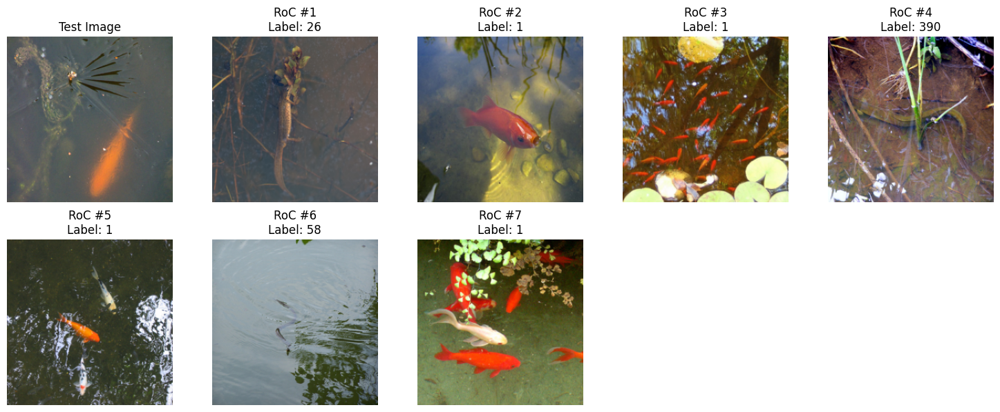

58

In [408]:
index = 2

print(f"True label: {test_datasets['test1'][index][1]}")

des_model.predict_weighted_robust(test_datasets['test1'][index][0], k=7, return_logits=False, explain=True)

True label: 1

Explainability Report:
Model #0: VisionTransformer
  - Competence score: 0.8097
  - Cosine similarity: 1.0000
  - Combined weight: 1.0000
  - Predicted class: 1
  - Confidence: 0.9396
  - Top-3 classes: [1, 58, 395] (probs: [0.94, 0.006, 0.001])
--------------------------------------------------

Final prediction: 1

Model weight distribution:
  Model #0: 1.0000
Suspected attacked model: Model #0 (VisionTransformer)

 RoC:


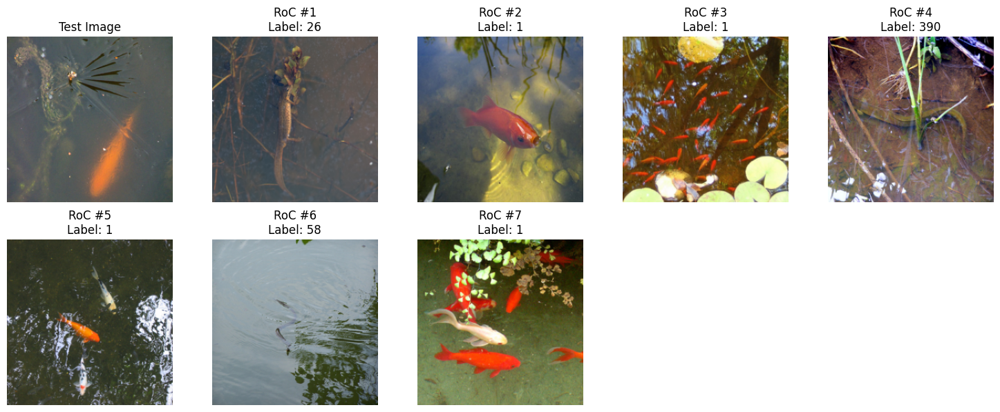

1

In [409]:
index = 2

print(f"True label: {test_datasets['test1'][index][1]}")

des_model.predict_weighted_robust_v2(test_datasets['test1'][index][0], k=7, return_logits=False, explain=True)

In [415]:
imagenet_classes[58]

'water snake'

In [398]:
imagenet_classes[916]

'web site'

In [35]:
des_model.predict_weighted_robust_v2(test_datasets['test1'][index][0], k=7, return_logits=False)

48

In [36]:
soft_ensemble = SoftVotingEnsemble(models=trained_pool, device='cuda')  
soft_ensemble.predict_single_with_probs(test_datasets['test1'][index][0])[1]

np.int64(48)

Indices of samples found by only 1 model: [12, 14, 66, 73, 97, 155, 248, 249, 268, 302, 333, 345, 379, 381, 387, 403, 406, 440, 461, 473, 480, 493, 530, 556, 560, 564, 570, 581, 605, 618, 762, 785, 790, 796, 814, 836, 859, 902, 906, 909, 916, 920, 928, 929, 989, 991, 995, 998, 1011, 1062, 1072, 1078, 1100, 1144, 1148, 1157, 1165, 1168, 1171, 1177, 1185, 1190, 1199, 1229, 1240, 1277, 1303, 1311, 1325, 1329, 1331, 1343, 1347, 1360, 1372, 1373, 1379, 1408, 1411, 1417, 1429, 1436, 1453, 1458, 1519, 1530, 1546, 1555, 1602, 1636, 1654, 1656, 1662, 1684, 1689, 1699, 1714, 1750, 1751, 1771, 1775, 1788, 1813, 1823, 1847, 1851, 1856, 1891, 1897, 1920, 1929, 1939, 1953, 1957, 1996, 1999]

True label:  48

Explainability Report:
Model #0: VisionTransformer
  - Competence score: 0.7143
  - Cosine similarity: 0.8569
  - Combined weight: 0.1474
  - Predicted class: 48
  - Confidence: 0.8767
  - Top-3 classes: [48, 50, 62] (probs: [0.877, 0.011, 0.007])
--------------------------------------------------
Model #1: EfficientNet
  - Competence score: 0.7143
  - Cosine similarity: 0.3762
  - Combined weight: 0.0647
  - Predicted class: 49
  - Confidence: 0.5628
  - Top-3 classes: [49, 44, 41] (probs: [0.563, 0.094, 0.086])
--------------------------------------------------
Model #2: VisionTransformer
  - Competence score: 0.7143
  - Cosine similarity: 0.9418
  - Combined weight: 0.1620
  - Predicted class: 48
  - Confidence: 0.3776
  - Top-3 classes: [48, 50, 49] (probs: [0.378, 0.259, 0.197])
--------------------------------------------------
Model #3: VGG
  - Competence score: 0.7143
  - Cosine similarity: 0.8847
  - Combined weight: 0.1522
  - Predicted class: 48
  - Confiden

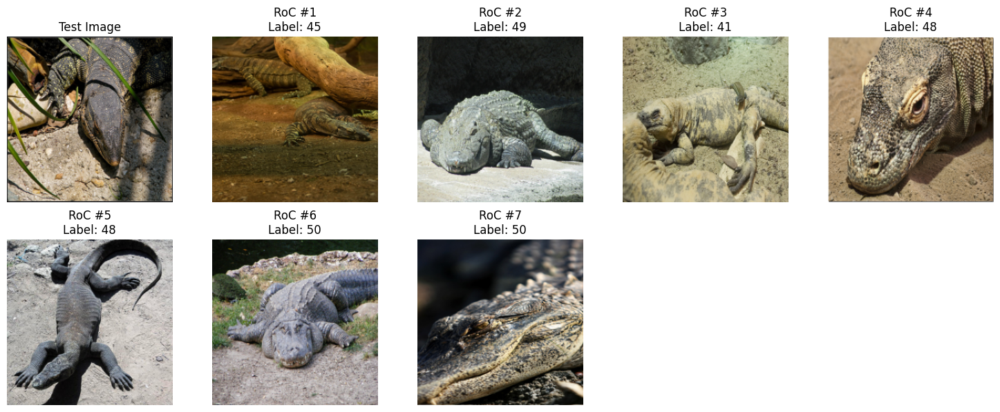

48

In [37]:
index = 97
print("True label: ", test_datasets['test1'][index][1])
des_model.predict_weighted_robust(test_datasets['test1'][index][0], k=7, return_logits=False, explain=True)


In [39]:
imagenet_classes[728]

'plastic bag'

True label:  7

Explainability Report:
Model #0: VGG
  - Competence score: 0.8571
  - Cosine similarity: 0.9995
  - Combined weight: 0.1599
  - Predicted class: 8
--------------------------------------------------
Model #1: Inception3
  - Competence score: 0.8571
  - Cosine similarity: 0.5572
  - Combined weight: 0.0892
  - Predicted class: 7
--------------------------------------------------
Model #2: GoogLeNet
  - Competence score: 0.8571
  - Cosine similarity: 0.9946
  - Combined weight: 0.1591
  - Predicted class: 8
--------------------------------------------------
Model #3: MobileNetV2
  - Competence score: 0.8571
  - Cosine similarity: 0.9479
  - Combined weight: 0.1517
  - Predicted class: 8
--------------------------------------------------
Model #4: EfficientNet
  - Competence score: 0.8571
  - Cosine similarity: 0.9995
  - Combined weight: 0.1599
  - Predicted class: 8
--------------------------------------------------
Model #5: ResNet
  - Competence score: 0.8571
  - Cosine

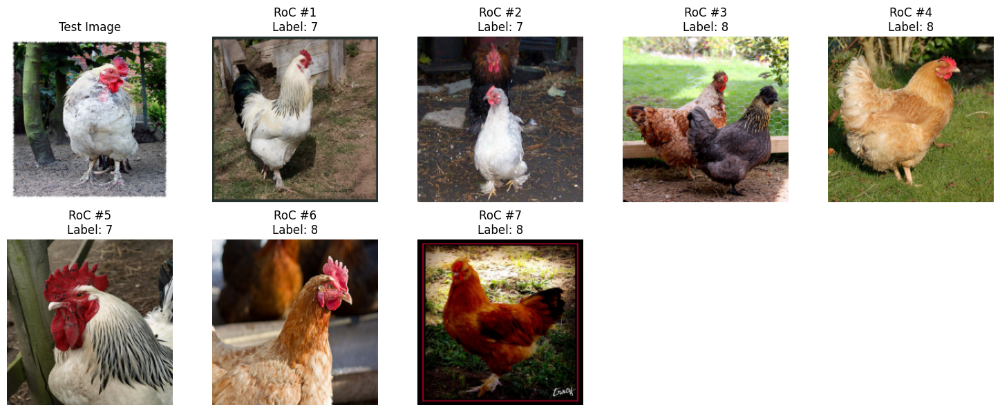

8

In [53]:
index = 14
print("True label: ", test_datasets['test1'][index][1])
des_model.predict_weighted_robust(test_datasets['test1'][index][0], k=7, return_logits=False, explain=True)


True label:  6

Explainability Report:
Model #0: VGG
  - Competence score: 0.5714
  - Cosine similarity: 0.7022
  - Combined weight: 0.1501
  - Predicted class: 973
--------------------------------------------------
Model #1: Inception3
  - Competence score: 0.5714
  - Cosine similarity: 0.3326
  - Combined weight: 0.0711
  - Predicted class: 750
--------------------------------------------------
Model #2: GoogLeNet
  - Competence score: 0.4286
  - Cosine similarity: 0.5105
  - Combined weight: 0.0818
  - Predicted class: 112
--------------------------------------------------
Model #3: MobileNetV2
  - Competence score: 0.7143
  - Cosine similarity: 0.6094
  - Combined weight: 0.1628
  - Predicted class: 980
--------------------------------------------------
Model #4: EfficientNet
  - Competence score: 0.8571
  - Cosine similarity: 0.5335
  - Combined weight: 0.1710
  - Predicted class: 6
--------------------------------------------------
Model #5: ResNet
  - Competence score: 0.5714
  

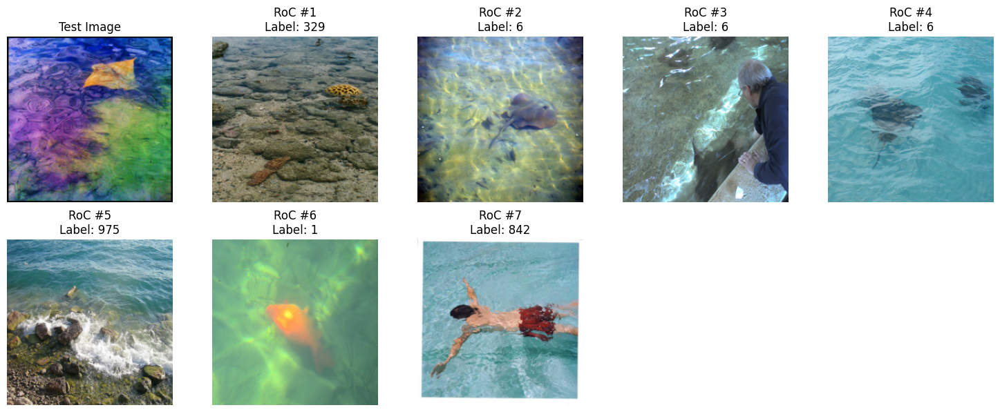

973

In [52]:
index = 12
print("True label: ", test_datasets['test1'][index][1])
des_model.predict_weighted_robust(test_datasets['test1'][index][0], k=7, return_logits=False, explain=True)


In [386]:
import torch
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from tqdm import tqdm

# Assume test_datasets['test1'] is a Dataset
embeddings = []
labels = []

# Step 1: Extract DINO embeddings
with torch.no_grad():
    for img, label in tqdm(test_datasets['test1']):
        img = img.unsqueeze(0).to(device)
        if img.shape[1] == 1:
            img = img.repeat(1, 3, 1, 1)  # If grayscale

        emb = des_model.dino_model.forward_features(img)
        cls_token = emb[:, 0, :]  # CLS token
        embeddings.append(cls_token.squeeze(0).cpu().numpy())
        labels.append(label)

embeddings = np.vstack(embeddings)
labels = np.array(labels)


100%|██████████████████████████████████████████████████████████████| 2000/2000 [00:19<00:00, 102.11it/s]


In [391]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
reduced = tsne.fit_transform(embeddings)

Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7f3712903a60>
Traceback (most recent call last):
  File "/home/infolab/anaconda3/envs/firuz/lib/python3.9/site-packages/threadpoolctl.py", line 1005, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/home/infolab/anaconda3/envs/firuz/lib/python3.9/site-packages/threadpoolctl.py", line 1187, in _make_controller_from_path
    lib_controller = controller_class(
  File "/home/infolab/anaconda3/envs/firuz/lib/python3.9/site-packages/threadpoolctl.py", line 114, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/home/infolab/anaconda3/envs/firuz/lib/python3.9/ctypes/__init__.py", line 374, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: /home/infolab/anaconda3/envs/firuz/lib/python3.9/site-packages/numpy.libs/libopenblas64_p-r0-0cf96a72.3.23.dev.so: cannot o

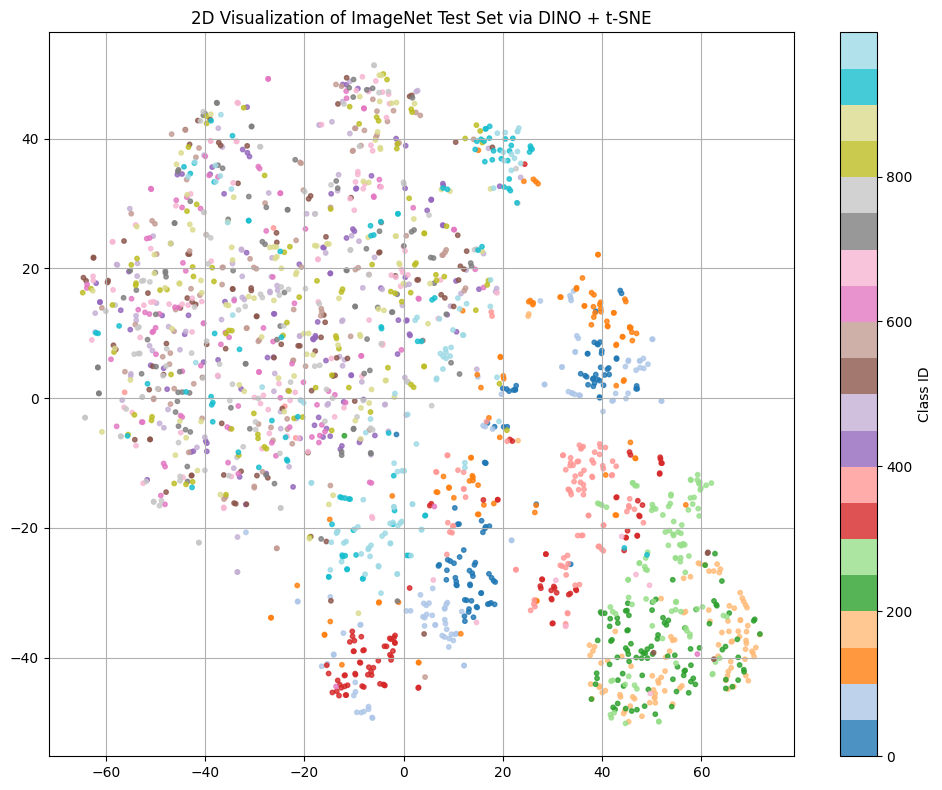

In [392]:
plt.figure(figsize=(10, 8))
scatter = plt.scatter(reduced[:, 0], reduced[:, 1], c=labels, cmap='tab20', s=10, alpha=0.8)
plt.title("2D Visualization of ImageNet Test Set via DINO + t-SNE")
plt.colorbar(scatter, label="Class ID")
plt.grid(True)
plt.tight_layout()
plt.show()

In [104]:
torch.from_numpy(x_test_adv).shape

torch.Size([1, 3, 224, 224])

In [291]:
class SoftVotingEnsemble:
    def __init__(self, models, device='cpu'):
        self.models = models
        self.device = device
        for model in self.models:
            model.eval().to(device)

    def predict(self, images, return_probs=False):
        probs = []
        with torch.no_grad():
            for model in self.models:
                outputs = model(images.to(self.device))
                softmaxed = torch.softmax(outputs, dim=1)
                probs.append(softmaxed.cpu().numpy())
        mean_probs = np.mean(np.stack(probs), axis=0)
        if return_probs:
            return mean_probs
        return np.argmax(mean_probs, axis=1)

    def predict_single_with_probs(self, image):
        image = image.unsqueeze(0)  # Shape [1, C, H, W]
        with torch.no_grad():
            model_probs = []
            for model in self.models:
                logits = model(image.to(self.device))
                softmaxed = torch.softmax(logits, dim=1)
                model_probs.append(softmaxed.cpu().numpy())
            mean_probs = np.mean(np.stack(model_probs), axis=0)
            probs = mean_probs[0]
            pred = np.argmax(probs)
            return probs, pred

In [39]:
from torch.utils.data import TensorDataset, DataLoader
from art.attacks.evasion import ProjectedGradientDescent
from art.estimators.classification import PyTorchClassifier
from sklearn.metrics import f1_score, roc_auc_score, accuracy_score
from collections import defaultdict


def evaluate_classifiers(pool, test_dataset, n_classes):
    loader = DataLoader(test_dataset, batch_size=64, shuffle=False)
    results = []

    for i, model in enumerate(pool):
        model = model.to(device)
        model.eval()
        y_true, y_pred, y_prob = [], [], []

        with torch.no_grad():
            for imgs, labels in loader:
                imgs, labels = imgs.to(device), labels.squeeze().long().to(device)
                outputs = model(imgs)
                preds = outputs.argmax(dim=1)
                probs = torch.softmax(outputs, dim=1)

                y_true.extend(labels.cpu().numpy())
                y_pred.extend(preds.cpu().numpy())
                y_prob.extend(probs.cpu().numpy())

        acc = (np.array(y_true) == np.array(y_pred)).mean() * 100
        f1 = f1_score(y_true, y_pred, average='macro') * 100
        try:
            auc = roc_auc_score(y_true, y_prob, multi_class='ovr') * 100
        except ValueError:
            auc = float('nan')  # Handle single-class test sets

        results.append({
            'classifier': model.__class__.__name__,
            'accuracy': acc,
            'f1': f1,
            'auc': auc,
        })

    return results

In [40]:
def predict_for_ensembles(ensemble_model, test_loader, ens_type): 
    metrics = {
        'accuracy': [],
        'f1': [],
        'auc': []
    } 
    y_true, y_pred, y_prob = [], [], [] 

    for imgs, labels in tqdm(test_loader):
        img = imgs[0]
        label = labels.item()

        if ens_type == "soft": 
            probs, pred = ensemble_model.predict_single_with_probs(img)
        if ens_type == "des": 
            logits = ensemble_model.predict_weighted(img, return_logits=True)
            probs = torch.softmax(logits, dim=0).cpu().numpy()
            pred = np.argmax(probs)
        if ens_type == "des+": 
            logits = ensemble_model.predict_weighted_robust(img, return_logits=True)
            probs = torch.softmax(logits, dim=0).cpu().numpy()
            pred = np.argmax(probs)
        if ens_type == "des++": 
            logits = ensemble_model.predict_weighted_robust_v2(img, return_logits=True)
            probs = torch.softmax(logits, dim=0).cpu().numpy()
            pred = np.argmax(probs)
    
        y_true.append(label)
        y_pred.append(pred)
        y_prob.append(probs)

    # Compute metrics
    acc = accuracy_score(y_true, y_pred) * 100
    f1 = f1_score(y_true, y_pred, average='macro') * 100
    try:
        auc = roc_auc_score(y_true, y_prob, multi_class='ovr') * 100
    except:
        auc = float('nan')

    print(f"{ens_type} Accuracy: {acc:.2f}%  | F1: {f1:.2f}%  | AUC: {auc:.2f}%")

    metrics['accuracy'].append(acc)
    metrics['f1'].append(f1)
    metrics['auc'].append(auc) 
    # print(y_prob)

    return metrics

In [292]:
SEEDS = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10] 

SEEDS = [1] 

total_start = time.time() 

selected_pool_indices = [0, 1, 2, 3]
TARGET_MODEL_INDEX = 1
EPSILON = 0.05

all_results = defaultdict(list) 

attacked_results = defaultdict(list)

des_metrics = []
soft_voting_metrics = [] 
des_plus_metrics = [] 
soft_voting_metrics_attacked = [] 
des_plus_metrics_attacked = []
des_plus_plus_metrics = []
des_plus_plus_metrics_attacked = [] 

pool = [trained_pool[i] for i in selected_pool_indices]  
des_model = VisionDES(val_dataset, pool)
des_model.fit()


for seed in SEEDS: 
    print(f"\n--- Test set: {seed} ---")

    seed_results = evaluate_classifiers(pool, test_datasets[f"test{seed}"], 1000)
    test_loader = DataLoader(test_datasets[f"test{seed}"], batch_size=1, shuffle=False, num_workers=4)   

    for res in seed_results:
        all_results[res['classifier']].append(res)

    # Build DES model
    des_metrics.append(predict_for_ensembles(des_model, test_loader, "des")) 

    # Soft Voting 
    soft_ensemble = SoftVotingEnsemble(models=pool, device='cuda')  
    soft_voting_metrics.append(predict_for_ensembles(soft_ensemble, test_loader, "soft")) 

    des_plus_metrics.append(predict_for_ensembles(des_model, test_loader, "des+")) 
    des_plus_plus_metrics.append(predict_for_ensembles(des_model, test_loader, "des++")) 

    ### Attack =============================================================================================
    print("Attacked")
    target_model = pool[TARGET_MODEL_INDEX]  
    target_model = target_model.to(device).eval() 

    dummy_optimizer = torch.optim.Adam(target_model.parameters())
    loss_fn = nn.CrossEntropyLoss() 

    # Wrap it for ART
    art_classifier = PyTorchClassifier(
        model=target_model,
        loss=loss_fn,
        optimizer=dummy_optimizer,
        input_shape=(1, 224, 224),  
        nb_classes=1000,
        clip_values=(0.0, 1.0),
    )

    x_test = []
    y_test = []
    
    for img, label in test_datasets[f"test{seed}"]:
        x_test.append(img.numpy())
        y_test.append(label)
    
    x_test = np.array(x_test)
    y_test = np.array(y_test)

    pgd_attack = ProjectedGradientDescent(estimator=art_classifier, eps=EPSILON, eps_step=0.01, max_iter=100)
    x_test_adv = pgd_attack.generate(x=x_test)

    adv_tensor = torch.tensor(x_test_adv).float()
    labels_tensor = torch.tensor(y_test).long()
    adv_dataset = TensorDataset(adv_tensor, labels_tensor)

    adv_test_loader = DataLoader(adv_dataset, batch_size=1, shuffle=False)  

    seed_attack_results = evaluate_classifiers(pool, adv_dataset, 1000) 
    for res in seed_attack_results:
        attacked_results[res['classifier']].append(res)


    # Soft Voting Atacked 
    soft_ensemble = SoftVotingEnsemble(models=pool, device='cuda')  
    soft_voting_metrics_attacked.append(predict_for_ensembles(soft_ensemble, adv_test_loader, "soft")) 
    
    des_plus_metrics_attacked.append(predict_for_ensembles(des_model, adv_test_loader, "des+"))  
    des_plus_plus_metrics_attacked.append(predict_for_ensembles(des_model, adv_test_loader, "des++"))  
    

total_end = time.time()
print(f"\n⏱️ Total time for all seeds: {(total_end - total_start) / 60:.2f} minutes")

100%|█████████████████████████████████████████████████████████████████| 938/938 [03:52<00:00,  4.04it/s]



--- Test set: 1 ---


100%|███████████████████████████████████████████████████████████████| 2000/2000 [07:41<00:00,  4.33it/s]


des Accuracy: 78.55%  | F1: 76.80%  | AUC: 99.82%


100%|███████████████████████████████████████████████████████████████| 2000/2000 [00:56<00:00, 35.52it/s]


soft Accuracy: 79.05%  | F1: 77.27%  | AUC: 99.82%


100%|███████████████████████████████████████████████████████████████| 2000/2000 [04:07<00:00,  8.08it/s]


des+ Accuracy: 79.00%  | F1: 77.21%  | AUC: 99.76%


100%|███████████████████████████████████████████████████████████████| 2000/2000 [04:07<00:00,  8.09it/s]


des++ Accuracy: 79.30%  | F1: 77.56%  | AUC: 99.59%
Attacked


PGD - Batches:   0%|          | 0/63 [00:00<?, ?it/s]

100%|███████████████████████████████████████████████████████████████| 2000/2000 [00:59<00:00, 33.62it/s]


soft Accuracy: 74.95%  | F1: 72.81%  | AUC: 99.78%


100%|███████████████████████████████████████████████████████████████| 2000/2000 [03:55<00:00,  8.50it/s]


des+ Accuracy: 76.90%  | F1: 75.03%  | AUC: 99.70%


100%|███████████████████████████████████████████████████████████████| 2000/2000 [03:58<00:00,  8.38it/s]


des++ Accuracy: 76.75%  | F1: 74.79%  | AUC: 99.52%

⏱️ Total time for all seeds: 35.98 minutes


In [308]:
SEEDS = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10] 

SEEDS = [1] 

total_start = time.time() 

selected_pool_indices = [0, 1, 2, 3]
TARGET_MODEL_INDEX = 1
EPSILON = 0.05

all_results = defaultdict(list) 

attacked_results = defaultdict(list)

des_metrics = []
soft_voting_metrics = [] 
des_plus_metrics = [] 
soft_voting_metrics_attacked = [] 
des_plus_metrics_attacked = []
des_plus_plus_metrics = []
des_plus_plus_metrics_attacked = [] 

pool = [trained_pool[i] for i in selected_pool_indices]  
des_model = VisionDES(val_dataset, pool)
des_model.fit()


for seed in SEEDS: 
    print(f"\n--- Test set: {seed} ---")

    seed_results = evaluate_classifiers(pool, test_datasets[f"test{seed}"], 1000)
    test_loader = DataLoader(test_datasets[f"test{seed}"], batch_size=1, shuffle=False, num_workers=4)   

    for res in seed_results:
        all_results[res['classifier']].append(res) 

    des_plus_plus_metrics.append(predict_for_ensembles(des_model, test_loader, "des++")) 

    ### Attack =============================================================================================
    print("Attacked")
    target_model = pool[TARGET_MODEL_INDEX]  
    target_model = target_model.to(device).eval() 

    dummy_optimizer = torch.optim.Adam(target_model.parameters())
    loss_fn = nn.CrossEntropyLoss() 

    # Wrap it for ART
    art_classifier = PyTorchClassifier(
        model=target_model,
        loss=loss_fn,
        optimizer=dummy_optimizer,
        input_shape=(1, 224, 224),  
        nb_classes=1000,
        clip_values=(0.0, 1.0),
    )

    x_test = []
    y_test = []
    
    for img, label in test_datasets[f"test{seed}"]:
        x_test.append(img.numpy())
        y_test.append(label)
    
    x_test = np.array(x_test)
    y_test = np.array(y_test)

    pgd_attack = ProjectedGradientDescent(estimator=art_classifier, eps=EPSILON, eps_step=0.01, max_iter=100)
    x_test_adv = pgd_attack.generate(x=x_test)

    adv_tensor = torch.tensor(x_test_adv).float()
    labels_tensor = torch.tensor(y_test).long()
    adv_dataset = TensorDataset(adv_tensor, labels_tensor)

    adv_test_loader = DataLoader(adv_dataset, batch_size=1, shuffle=False)  

    seed_attack_results = evaluate_classifiers(pool, adv_dataset, 1000) 
    for res in seed_attack_results:
        attacked_results[res['classifier']].append(res)

    des_plus_plus_metrics_attacked.append(predict_for_ensembles(des_model, adv_test_loader, "des++"))  
    

total_end = time.time()
print(f"\n⏱️ Total time for all seeds: {(total_end - total_start) / 60:.2f} minutes")

100%|█████████████████████████████████████████████████████████████████| 938/938 [03:32<00:00,  4.41it/s]



--- Test set: 1 ---


100%|███████████████████████████████████████████████████████████████| 2000/2000 [04:04<00:00,  8.18it/s]


des++ Accuracy: 79.30%  | F1: 77.56%  | AUC: 99.45%
Attacked


PGD - Batches:   0%|          | 0/63 [00:00<?, ?it/s]

100%|███████████████████████████████████████████████████████████████| 2000/2000 [03:55<00:00,  8.51it/s]


des++ Accuracy: 76.75%  | F1: 74.79%  | AUC: 99.44%

⏱️ Total time for all seeds: 17.68 minutes


In [293]:
import pandas as pd 

summary = []

for clf_name, metrics_list in all_results.items():
    accs = [m['accuracy'] for m in metrics_list]
    f1s = [m['f1'] for m in metrics_list]
    aucs = [m['auc'] for m in metrics_list]

    summary.append({
        'Classifier': clf_name,
        'Accuracy': f"{np.mean(accs):.2f} ± {np.std(accs):.2f}",
        'F1': f"{np.mean(f1s):.2f} ± {np.std(f1s):.2f}",
        'AUC': f"{np.mean(aucs):.2f} ± {np.std(aucs):.2f}",
    })

df_summary = pd.DataFrame(summary)
print(df_summary)

          Classifier      Accuracy            F1           AUC
0  VisionTransformer  79.30 ± 0.00  77.34 ± 0.00  99.67 ± 0.00
1        MobileNetV2  67.55 ± 0.00  65.24 ± 0.00  99.60 ± 0.00
2       EfficientNet  75.60 ± 0.00  73.77 ± 0.00  99.72 ± 0.00
3             ResNet  75.50 ± 0.00  73.46 ± 0.00  99.74 ± 0.00


In [294]:
import pandas as pd

summary = {
    'Metric': [],
    'Mean ± Std': []
}

for metric in ['accuracy', 'f1', 'auc']:
    values =  [m[metric] for m in des_metrics] 
    mean = np.nanmean(values)
    std = np.nanstd(values)
    summary['Metric'].append(metric.upper())
    summary['Mean ± Std'].append(f"{mean:.2f} ± {std:.2f}")

df_summary = pd.DataFrame(summary)
print("\n=== Final DES Performance (across seeds) ===")
print(df_summary)


=== Final DES Performance (across seeds) ===
     Metric    Mean ± Std
0  ACCURACY  78.55 ± 0.00
1        F1  76.80 ± 0.00
2       AUC  99.82 ± 0.00


In [295]:
import pandas as pd

summary = {
    'Metric': [],
    'Mean ± Std': []
}

for metric in ['accuracy', 'f1', 'auc']:
    values =  [m[metric] for m in des_plus_metrics] 
    mean = np.nanmean(values)
    std = np.nanstd(values)
    summary['Metric'].append(metric.upper())
    summary['Mean ± Std'].append(f"{mean:.2f} ± {std:.2f}")

df_summary = pd.DataFrame(summary)
print("\n=== Final DES+ Performance (across seeds) ===")
print(df_summary)


=== Final DES+ Performance (across seeds) ===
     Metric    Mean ± Std
0  ACCURACY  79.00 ± 0.00
1        F1  77.21 ± 0.00
2       AUC  99.76 ± 0.00


In [296]:
import pandas as pd

summary = {
    'Metric': [],
    'Mean ± Std': []
}

for metric in ['accuracy', 'f1', 'auc']:
    values =  [m[metric] for m in soft_voting_metrics] 
    mean = np.nanmean(values)
    std = np.nanstd(values)
    summary['Metric'].append(metric.upper())
    summary['Mean ± Std'].append(f"{mean:.2f} ± {std:.2f}")

df_summary = pd.DataFrame(summary)
print("\n=== Final SOFT Performance (across seeds) ===")
print(df_summary)


=== Final SOFT Performance (across seeds) ===
     Metric    Mean ± Std
0  ACCURACY  79.05 ± 0.00
1        F1  77.27 ± 0.00
2       AUC  99.82 ± 0.00


# <div style="color:white;display:fill;border-radius:5px;background-color:#f02263;letter-spacing:0.5px;overflow:hidden"><p style="padding:20px;color:white;overflow:hidden;margin:0;font-size:110%"><b></b> Adversarial Attack Results</p></div>

In [297]:
import pandas as pd 

summary = []

for clf_name, metrics_list in attacked_results.items():
    accs = [m['accuracy'] for m in metrics_list]
    f1s = [m['f1'] for m in metrics_list]
    aucs = [m['auc'] for m in metrics_list]

    summary.append({
        'Classifier': clf_name,
        'Accuracy': f"{np.mean(accs):.2f} ± {np.std(accs):.2f}",
        'F1': f"{np.mean(f1s):.2f} ± {np.std(f1s):.2f}",
        'AUC': f"{np.mean(aucs):.2f} ± {np.std(aucs):.2f}",
    })

df_summary = pd.DataFrame(summary)
print(df_summary)

          Classifier      Accuracy            F1           AUC
0  VisionTransformer  79.15 ± 0.00  77.13 ± 0.00  99.64 ± 0.00
1        MobileNetV2  10.85 ± 0.00   9.49 ± 0.00  72.74 ± 0.00
2       EfficientNet  73.10 ± 0.00  71.43 ± 0.00  99.70 ± 0.00
3             ResNet  74.25 ± 0.00  72.25 ± 0.00  99.74 ± 0.00


In [298]:
import pandas as pd

summary = {
    'Metric': [],
    'Mean ± Std': []
}

for metric in ['accuracy', 'f1', 'auc']:
    values =  [m[metric] for m in des_plus_metrics_attacked] 
    mean = np.nanmean(values)
    std = np.nanstd(values)
    summary['Metric'].append(metric.upper())
    summary['Mean ± Std'].append(f"{mean:.2f} ± {std:.2f}")

df_summary = pd.DataFrame(summary)
print("\n=== Final DES+ Performance (across seeds) ===")
print(df_summary)


=== Final DES+ Performance (across seeds) ===
     Metric    Mean ± Std
0  ACCURACY  76.90 ± 0.00
1        F1  75.03 ± 0.00
2       AUC  99.70 ± 0.00


In [299]:
import pandas as pd

summary = {
    'Metric': [],
    'Mean ± Std': []
}

for metric in ['accuracy', 'f1', 'auc']:
    values =  [m[metric] for m in soft_voting_metrics_attacked] 
    mean = np.nanmean(values)
    std = np.nanstd(values)
    summary['Metric'].append(metric.upper())
    summary['Mean ± Std'].append(f"{mean:.2f} ± {std:.2f}")

df_summary = pd.DataFrame(summary)
print("\n=== Final SOFT Performance (across seeds) ===")
print(df_summary)


=== Final SOFT Performance (across seeds) ===
     Metric    Mean ± Std
0  ACCURACY  74.95 ± 0.00
1        F1  72.81 ± 0.00
2       AUC  99.78 ± 0.00


# <div style="color:white;display:fill;border-radius:5px;background-color:#f02263;letter-spacing:0.5px;overflow:hidden"><p style="padding:20px;color:white;overflow:hidden;margin:0;font-size:110%"><b></b> Black Box Attack to VisionDES </p></div>

In [266]:
trained_pool = [
        vit_b_16(pretrained=True).eval(), 
        mobilenet_v2(pretrained=True).eval(), 
        efficientnet_b0(pretrained=True).eval(), 
        resnet101(pretrained=True).eval()
       ]

In [267]:
des_model = VisionDES(val_dataset, trained_pool)
des_model.fit()

100%|█████████████████████████████████████████████████████████████████| 938/938 [03:40<00:00,  4.26it/s]


In [268]:
import torch.nn as nn

class DummyModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.param = nn.Parameter(torch.zeros(1))  # just one dummy param

    def forward(self, x):
        return x  # identity pass-through

In [269]:
from art.estimators.classification import PyTorchClassifier
import numpy as np
import torch

class VisionDESWrapper(PyTorchClassifier):
    def __init__(self, vision_des, input_shape=(3, 224, 224), nb_classes=9, clip_values=(0.0, 1.0)):
        self.vision_des = vision_des
        self._device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        dummy_model = DummyModel()

        loss = torch.nn.CrossEntropyLoss()
        optimizer = torch.optim.SGD(dummy_model.parameters(), lr=0.01)

        super().__init__(
            model=dummy_model,
            loss=loss,
            optimizer=optimizer,
            input_shape=input_shape,
            nb_classes=nb_classes,
            clip_values=clip_values
        )

    def predict(self, x, logits=False, **kwargs):
        self.vision_des.device = self.device
        self.vision_des.pool = [m.to(self.device).eval() for m in self.vision_des.pool]
    
        batch_size = x.shape[0]
        all_probs = []
    
        for i in range(batch_size):
            img = x[i]  # shape (C, H, W)
            img = torch.tensor(x[i]).to(self.device).float() 
            # call your VisionDES method for single image, return logits or probs
            weighted_logits = self.vision_des.predict_weighted_robust(
                torch.tensor(img).to(self.device), return_logits=True
            )
            probs = torch.softmax(weighted_logits, dim=0).cpu().numpy()
            all_probs.append(probs)
    
        all_probs = np.stack(all_probs)  # shape (N, nb_classes)
    
        if logits:
            # return logits instead of probs
            eps = 1e-12
            return np.log(all_probs + eps)
        else:
            return all_probs

    def _softmax(self, logits):
        if logits.ndim == 1:
            logits = logits[np.newaxis, :]
        e_x = np.exp(logits - np.max(logits, axis=1, keepdims=True))
        return e_x / np.sum(e_x, axis=1, keepdims=True)


In [270]:
x_test.shape

(2000, 3, 224, 224)

In [271]:
from art.attacks.evasion import HopSkipJump
from art.attacks.evasion import SimBA 

wrapped_model = VisionDESWrapper(
    vision_des=des_model,
    input_shape=(3, 224, 224),
    nb_classes=1000,
    clip_values=(0.0, 1.0)
)

attack = SimBA(classifier=wrapped_model, max_iter=7000, epsilon=0.5)
x_adv = attack.generate(x=x_test[:5])


SimBA - sample:   0%|          | 0/5 [00:00<?, ?it/s]

In [272]:
x_test[:1].shape[1]

3

Showing 5 sample(s)...



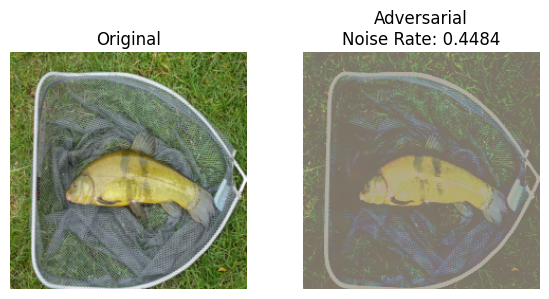

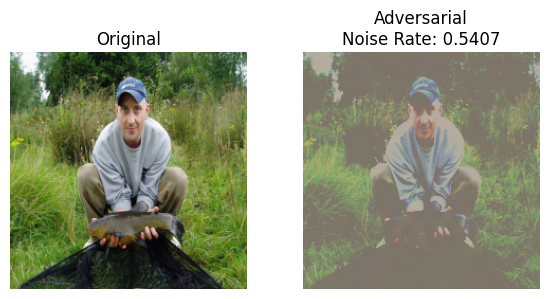

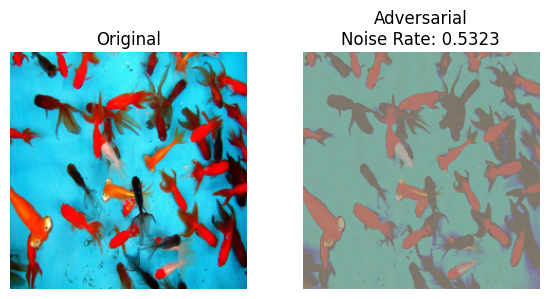

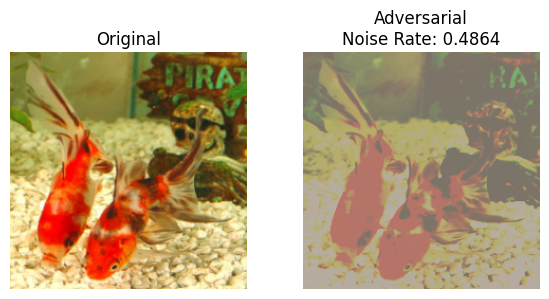

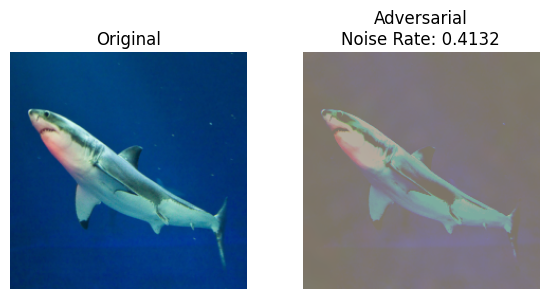


Average Noise Rate (1 - SSIM): 0.4842


In [273]:
visualize_adversarial_examples(x_test[:5], x_adv, max_images=5)


In [187]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim

imagenet_mean = np.array([0.485, 0.456, 0.406])
imagenet_std = np.array([0.229, 0.224, 0.225])

def denormalize(img):
    img = img.copy()
    for i in range(3):
        img[i] = img[i] * imagenet_std[i] + imagenet_mean[i]
    return np.clip(img, 0, 1)

def visualize_adversarial_examples(x_clean, x_adv, labels=None, max_images=5):
    num_images = min(len(x_clean), max_images)
    noise_rates = []

    print(f"Showing {num_images} sample(s)...\n")

    for i in range(num_images):
        clean = denormalize(x_clean[i]).transpose(1, 2, 0)
        adv = denormalize(x_adv[i]).transpose(1, 2, 0)

        # SSIM for small images: set win_size explicitly and use channel_axis
        score = ssim(clean, adv, data_range=1.0, win_size=7, channel_axis=2)
        noise_rate = 1 - score
        noise_rates.append(noise_rate)

        fig, axs = plt.subplots(1, 2, figsize=(6, 3))
        axs[0].imshow(clean)
        axs[0].set_title("Original")
        axs[0].axis("off")

        axs[1].imshow(adv)
        axs[1].set_title(f"Adversarial\nNoise Rate: {noise_rate:.4f}")
        axs[1].axis("off")

        plt.tight_layout()
        plt.show()

    print(f"\nAverage Noise Rate (1 - SSIM): {np.mean(noise_rates):.4f}")


In [274]:
for i in range(5): 
    print(des_model.predict_weighted_robust(torch.tensor(x_adv[i]).float())) 

669
346
4
921
315


In [276]:
for i in range(5): 
    print(soft_ensemble.predict_single_with_probs(torch.tensor(x_adv[i]).float())[1]) 

0
621
1
1
2



Explainability Report:
Model #0: VisionTransformer
  - Competence score: 0.5714
  - Cosine similarity: 0.5456
  - Combined weight: 0.1982
  - Predicted class: 794
  - Confidence: 0.8642
  - Top-3 classes: [794, 1, 973] (probs: [0.864, 0.011, 0.007])
--------------------------------------------------
Model #1: MobileNetV2
  - Competence score: 0.5714
  - Cosine similarity: 0.6302
  - Combined weight: 0.2289
  - Predicted class: 4
  - Confidence: 0.9402
  - Top-3 classes: [4, 2, 1] (probs: [0.94, 0.012, 0.011])
--------------------------------------------------
Model #2: EfficientNet
  - Competence score: 0.5714
  - Cosine similarity: 0.8610
  - Combined weight: 0.3128
  - Predicted class: 4
  - Confidence: 0.2020
  - Top-3 classes: [4, 794, 842] (probs: [0.202, 0.118, 0.055])
--------------------------------------------------
Model #3: ResNet
  - Competence score: 0.7143
  - Cosine similarity: 0.5727
  - Combined weight: 0.2601
  - Predicted class: 1
  - Confidence: 0.9938
  - Top-3 cl

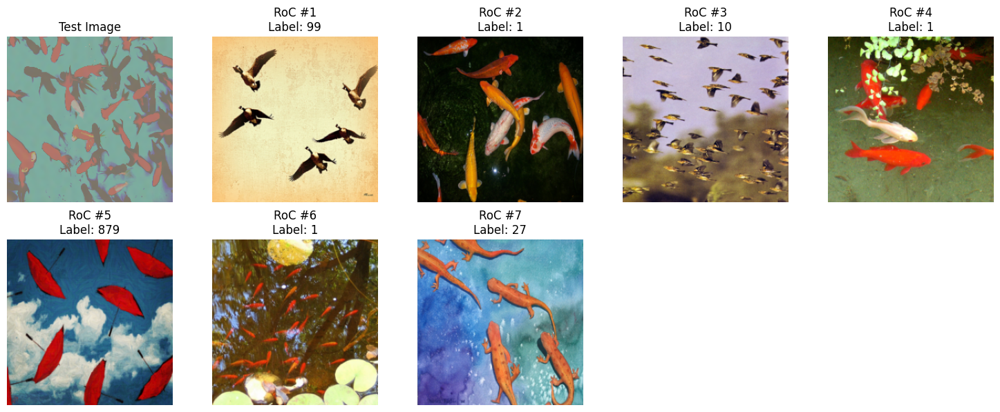

4

In [280]:
des_model.predict_weighted_robust(torch.tensor(x_adv[2]).float(), explain=True)


Explainability Report:
Model #0: VisionTransformer
  - Competence score: 1.0000
  - Cosine similarity: 1.0000
  - Combined weight: 0.2500
  - Predicted class: 1
  - Confidence: 0.9121
  - Top-3 classes: [1, 973, 794] (probs: [0.912, 0.0, 0.0])
--------------------------------------------------
Model #1: MobileNetV2
  - Competence score: 1.0000
  - Cosine similarity: 0.9999
  - Combined weight: 0.2500
  - Predicted class: 1
  - Confidence: 0.9595
  - Top-3 classes: [1, 115, 973] (probs: [0.959, 0.014, 0.008])
--------------------------------------------------
Model #2: EfficientNet
  - Competence score: 1.0000
  - Cosine similarity: 1.0000
  - Combined weight: 0.2500
  - Predicted class: 1
  - Confidence: 0.9962
  - Top-3 classes: [1, 120, 973] (probs: [0.996, 0.001, 0.0])
--------------------------------------------------
Model #3: ResNet
  - Competence score: 1.0000
  - Cosine similarity: 1.0000
  - Combined weight: 0.2500
  - Predicted class: 1
  - Confidence: 0.9953
  - Top-3 class

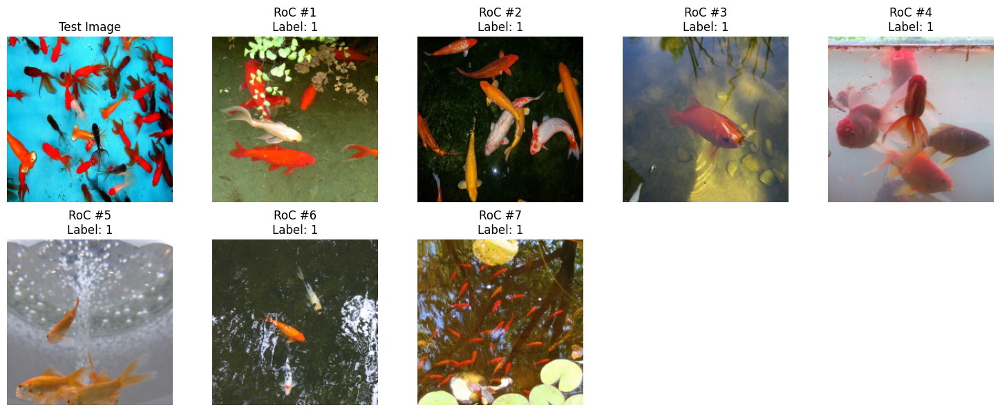

1

In [281]:
des_model.predict_weighted_robust(torch.tensor(x_test[2]).float(), explain=True)

# <div style="color:white;display:fill;border-radius:5px;background-color:#f02263;letter-spacing:0.5px;overflow:hidden"><p style="padding:20px;color:white;overflow:hidden;margin:0;font-size:110%"><b></b> Black Box Attack to Soft Voting </p></div>

In [309]:
import torch
import numpy as np
from art.estimators.classification import PyTorchClassifier

class SoftVotingEnsemble(torch.nn.Module):
    def __init__(self, classifiers):
        super().__init__()
        self.classifiers = torch.nn.ModuleList(classifiers)
        for clf in self.classifiers:
            clf.eval()

    def forward(self, x):
        # Average softmax probabilities
        with torch.no_grad():
            probs = [torch.softmax(clf(x), dim=1) for clf in self.classifiers]
            avg_prob = torch.stack(probs).mean(dim=0)
        return avg_prob

In [310]:
trained_pool = [
        vit_b_16(pretrained=True).eval(), 
        mobilenet_v2(pretrained=True).eval(), 
        efficientnet_b0(pretrained=True).eval(), 
        resnet101(pretrained=True).eval()
       ]

In [317]:
ensemble_model = SoftVotingEnsemble(classifiers=trained_pool)

voting_art_classifier = PyTorchClassifier(
    model=ensemble_model,
    loss=torch.nn.CrossEntropyLoss(),
    input_shape=(3, 224, 224),
    nb_classes=1000,
    clip_values=(0.0, 1.0),
)

In [318]:
from art.attacks.evasion import HopSkipJump
from art.attacks.evasion import SimBA 

attack = SimBA(classifier=voting_art_classifier, max_iter=7000, epsilon=0.5)
x_adv = attack.generate(x=x_test[:10])

SimBA - sample:   0%|          | 0/10 [00:00<?, ?it/s]

Showing 5 sample(s)...



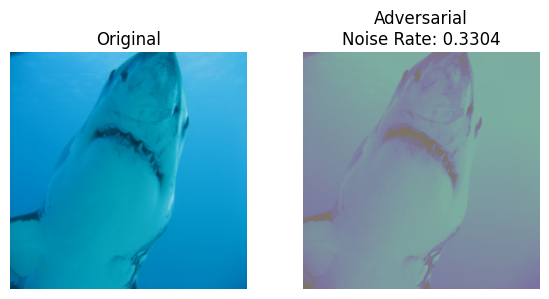

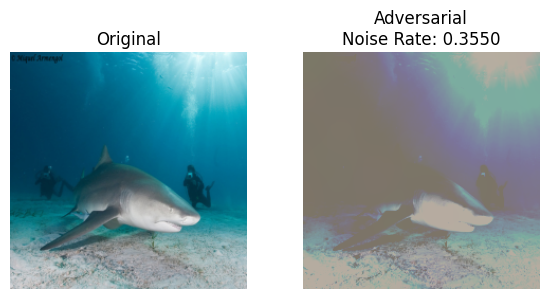

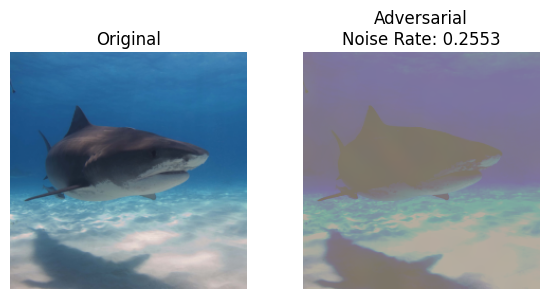

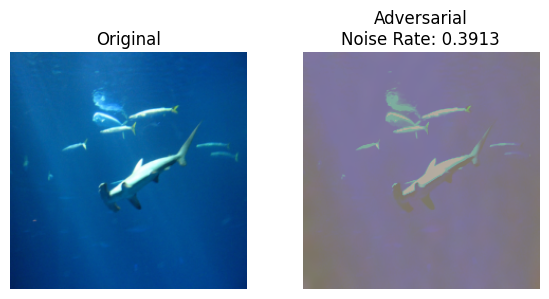

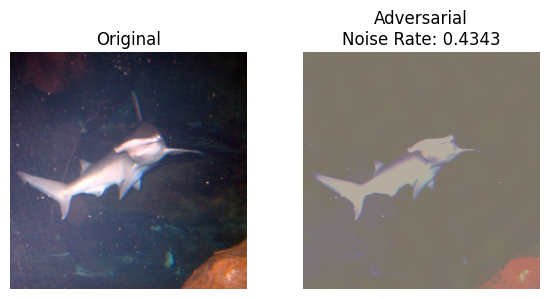


Average Noise Rate (1 - SSIM): 0.3533


In [328]:
visualize_adversarial_examples(x_test[5:10], x_adv[5:10], max_images=5)

In [320]:
x_adv.shape

(10, 3, 224, 224)

In [322]:
for i in range(10): 
    print(des_model.predict_weighted_robust(torch.tensor(x_adv[i]).float())) 

776
405
1
1
34
2
3
6
983
1


In [323]:
for i in range(10): 
    print(soft_ensemble.predict_single_with_probs(torch.tensor(x_adv[i]).float())[1]) 

776
405
1
395
34
3
148
6
983
1


In [324]:
for i in range(10): 
    print(des_model.predict_weighted_robust_v2(torch.tensor(x_adv[i]).float())) 

776
405
1
395
34
3
148
6
983
4


In [326]:
for i in range(10): 
    print(y_test[i]) 

0
0
1
1
2
2
3
3
4
4



Explainability Report:
Model #0: VisionTransformer
  - Competence score: 0.8074
  - Cosine similarity: 0.4315
  - Combined weight: 0.1742
  - Predicted class: 234
  - Confidence: 0.1378
  - Top-3 classes: [234, 78, 237] (probs: [0.138, 0.086, 0.069])
--------------------------------------------------
Model #1: MobileNetV2
  - Competence score: 0.4413
  - Cosine similarity: 0.5205
  - Combined weight: 0.1148
  - Predicted class: 351
  - Confidence: 0.1175
  - Top-3 classes: [351, 346, 352] (probs: [0.117, 0.102, 0.065])
--------------------------------------------------
Model #2: EfficientNet
  - Competence score: 0.5369
  - Cosine similarity: 0.7589
  - Combined weight: 0.2037
  - Predicted class: 671
  - Confidence: 0.2118
  - Top-3 classes: [671, 0, 491] (probs: [0.212, 0.203, 0.177])
--------------------------------------------------
Model #3: ResNet
  - Competence score: 0.5766
  - Cosine similarity: 0.5433
  - Combined weight: 0.1566
  - Predicted class: 802
  - Confidence: 0.131

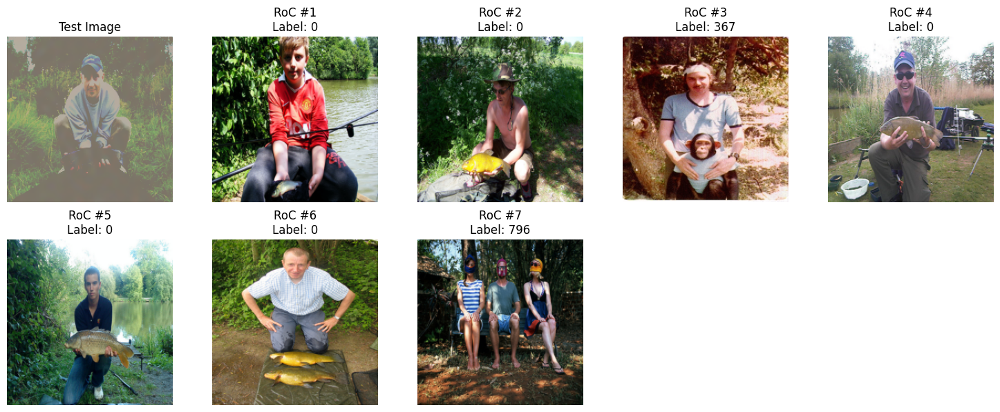

671

In [304]:
des_model.predict_weighted_robust_v2(torch.tensor(x_adv[1]).float(), explain=True)


Explainability Report:
Model #0: VisionTransformer
  - Competence score: 1.0000
  - Cosine similarity: 0.4315
  - Combined weight: 0.2929
  - Predicted class: 234
  - Confidence: 0.1378
  - Top-3 classes: [234, 78, 237] (probs: [0.138, 0.086, 0.069])
--------------------------------------------------
Model #1: MobileNetV2
  - Competence score: 0.5714
  - Cosine similarity: 0.5205
  - Combined weight: 0.2019
  - Predicted class: 351
  - Confidence: 0.1175
  - Top-3 classes: [351, 346, 352] (probs: [0.117, 0.102, 0.065])
--------------------------------------------------
Model #2: EfficientNet
  - Competence score: 0.5714
  - Cosine similarity: 0.7589
  - Combined weight: 0.2944
  - Predicted class: 671
  - Confidence: 0.2118
  - Top-3 classes: [671, 0, 491] (probs: [0.212, 0.203, 0.177])
--------------------------------------------------
Model #3: ResNet
  - Competence score: 0.5714
  - Cosine similarity: 0.5433
  - Combined weight: 0.2108
  - Predicted class: 802
  - Confidence: 0.131

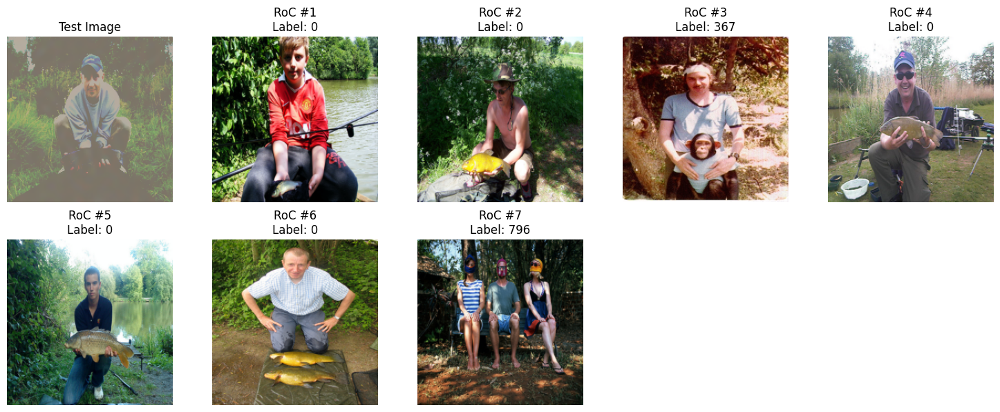

0

In [305]:
des_model.predict_weighted_robust(torch.tensor(x_adv[1]).float(), explain=True)